
# Módulo de productividad de pozos

Analisis estadístico y simulación de gasto de aceite en base a producción histórica en México. 

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os
import scipy
import scipy.stats
from scipy.optimize import curve_fit
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
%matplotlib inline

import timeit

In [2]:
pd.set_option('display.max_rows', 100_000_000)
pd.set_option('display.max_columns', 100_000_000)
pd.set_option('display.width', 1_000)
pd.set_option('precision', 2)
pd.options.display.float_format = '{:,.2f}'.format

In [3]:
import timeit
tic=timeit.default_timer()
toc=timeit.default_timer()
toc - tic #elapsed time in seconds

0.00016574999999363627

<div class="alert alert-block alert-danger">

### <b>Check Harmonic Equation</b>
<br>
· b should be = 1, check bounds argument in harmonic_equation
<br>
· automate unique_well_list generation
<br>

</div>

In [4]:
def input_pozos(x): 
        
        global pozos
        pozos = pd.DataFrame(columns=["Campo",
                                      "Coordenadas",
                                      "Qo aceite",
                                      "Qo gas"])

        #parts=int(input("Numero de campos: "))
        parts = x

        # !!!!!! Verificar resultado de la funcion format... cambiar a integer
        
        for i in range(parts):
            campo = input("Nombre de Campo: ")
            coordenadas = input("Coordenadas: ".format(campo))
            Qo_aceite = input("Qo aceite: ".format(campo))
            Qo_gas = input("Qo gas: ".format(campo))
            df1 = pd.DataFrame(data=[[campo,coordenadas,Qo_aceite,Qo_gas]],columns=["Campo",
                                                                                    "Coordenadas",
                                                                                    "Qo aceite",
                                                                                    "Qo gas"])
            pozos = pd.concat([pozos,df1], axis=0)

        pozos.index = range(len(pozos.index))

## Estadistica - Kumaza

,Unnamed: 0,fecha,campo,yacimiento,plataforma,pozo,inicio_produccion_aceite,ultima_produccion_aceite,gasto_aceite_Mbd,gasto_agua_Mbd,gasto_gas_MMpcd,gasto_gas_BN_MMpcd,RGA_m3/m3,aceite_acumulado_MMb,agua_acumulada_MMb,gas_acumulado_MMMpc,cima_intervalo_mvbnm,base_intervalo_mvbnm,distancia_superior_intervalo_a_contacto_gas-aceite_(m),fluyente_BEC_o _BN,RGA_pc/bl,nivel_CGA,cima_mv -nivel_CGA,estatus,arriba_abajo_CGA,campo_yacimiento,first_oil,Dias Produciendo,days_online,Exponential_Predicted,Hyperbolic_Predicted,Harmonic_Predicted
0,0,2016-01-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/01/16,1.22,0.01,2.30,1.79,nan,9.93,0.13,5.87,"2,585.00","2,603.00",-,BN,"1,889.96",2919.2,-334.2,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,0,0,1.22,0.60,0.61
1,178,2016-02-29,KU,KU_CCE,KU-A,KU-10,02/28/86,29/02/16,0.15,0.01,0.28,0.40,331.05,9.93,0.13,5.87,"2,585.00","2,603.00",-,BN,"1,858.69",2924.518217,-339.518217,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,29,29,0.00,0.60,0.60
2,357,2016-03-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/03/16,0.44,0.10,0.90,2.05,367.06,9.94,0.14,5.90,"2,585.00","2,603.00",-,BN,"2,060.87",2918.6,-333.6,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,60,60,0.00,0.59,0.59
3,538,2016-04-30,KU,KU_CCE,KU-A,KU-10,02/28/86,30/04/16,0.44,0.03,0.97,1.81,389.10,9.96,0.14,5.93,"2,585.00","2,603.00",-,BN,"2,184.62",2918.6,-333.6,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,90,90,0.00,0.59,0.59
4,719,2016-05-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/05/16,0.45,0.07,0.98,2.61,388.96,9.97,0.14,5.96,"2,585.00","2,603.00",-,BN,"2,183.85",2923.5,-338.5,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,121,121,0.00,0.58,0.58


Index(['Unnamed: 0', 'fecha', 'campo', 'yacimiento', 'plataforma', 'pozo', 'inicio_produccion_aceite', 'ultima_produccion_aceite', 'gasto_aceite_Mbd', 'gasto_agua_Mbd', 'gasto_gas_MMpcd', 'gasto_gas_BN_MMpcd', 'RGA_m3/m3', 'aceite_acumulado_MMb', 'agua_acumulada_MMb', 'gas_acumulado_MMMpc', 'cima_intervalo_mvbnm', 'base_intervalo_mvbnm', 'distancia_superior_intervalo_a_contacto_gas-aceite_(m)', 'fluyente_BEC_o _BN', 'RGA_pc/bl', 'nivel_CGA', 'cima_mv -nivel_CGA', 'estatus', 'arriba_abajo_CGA', 'campo_yacimiento', 'first_oil', 'Dias Produciendo', 'days_online', 'Exponential_Predicted', 'Hyperbolic_Predicted', 'Harmonic_Predicted'], dtype='object')

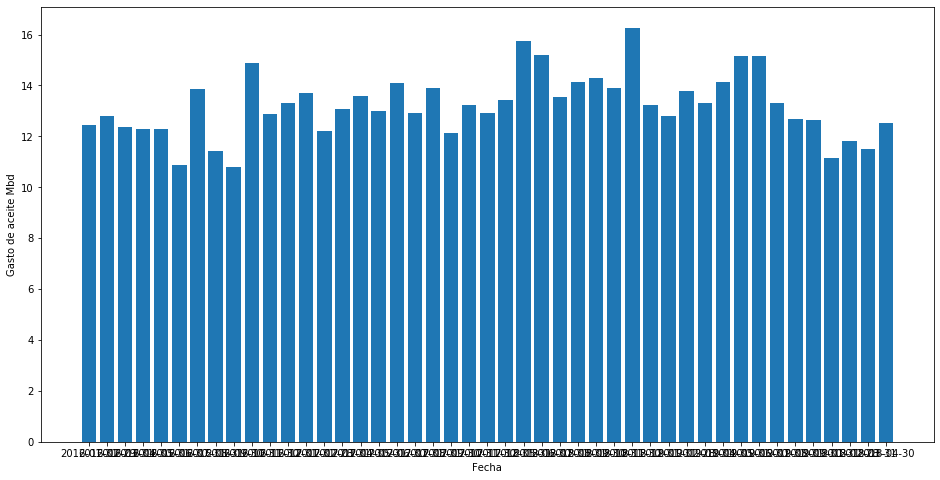

In [5]:
df=pd.read_csv(r'/Users/fffte/ainda_drive/python/csv/benchmark/kumaza_dca.csv',
               parse_dates=True)
display(df.head(),df.columns)

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(df.fecha,df.gasto_aceite_Mbd)
ax.set_xlabel('Fecha')
ax.set_ylabel('Gasto de aceite Mbd')
plt.show()
#df.gasto_gas_MMpcd.plot(figsize=(20,10),cmap='viridis')

## Dispersion Analysis

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.72 µs


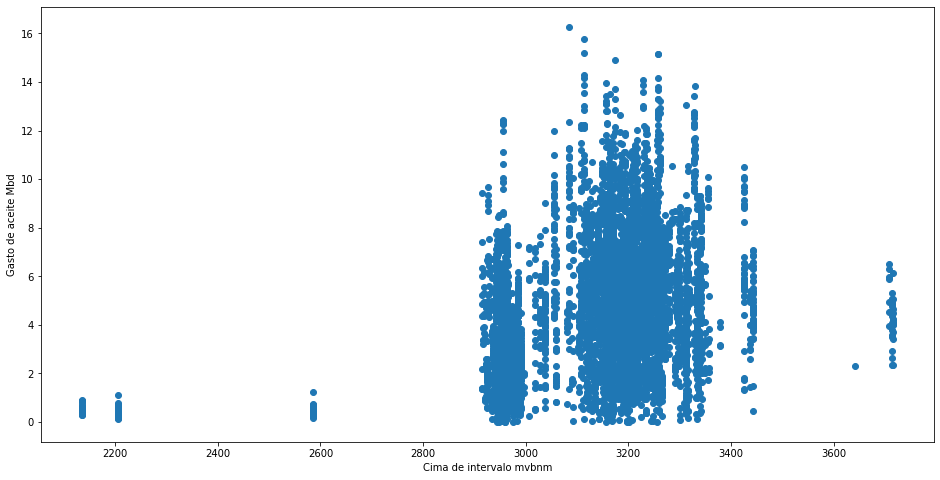

In [6]:
%time 

fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['cima_intervalo_mvbnm'],df['gasto_aceite_Mbd'])
ax.set_xlabel('Cima de intervalo mvbnm')
ax.set_ylabel('Gasto de aceite Mbd')
plt.show()

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 4.77 µs


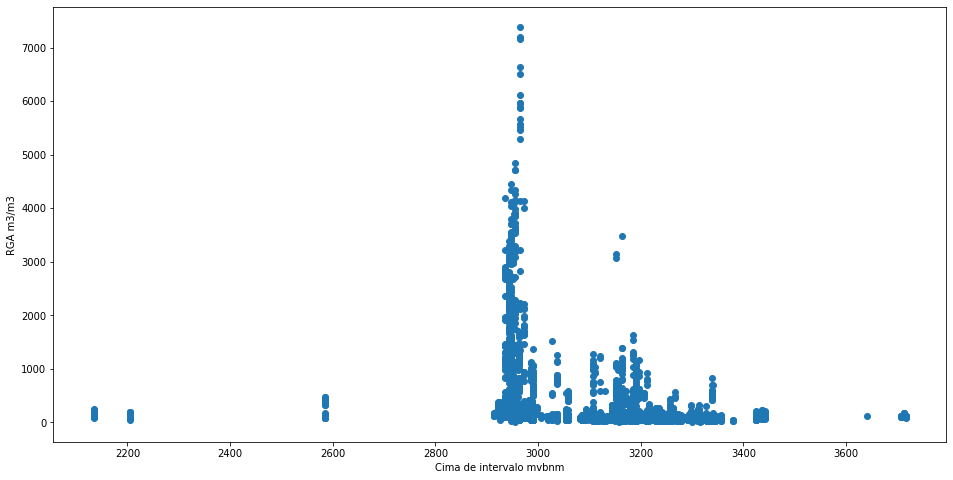

In [7]:
%time 

fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['cima_intervalo_mvbnm'],df['RGA_m3/m3'] )
ax.set_xlabel('Cima de intervalo mvbnm')
ax.set_ylabel('RGA m3/m3')
plt.show()

In [8]:
df.columns

Index(['Unnamed: 0', 'fecha', 'campo', 'yacimiento', 'plataforma', 'pozo', 'inicio_produccion_aceite', 'ultima_produccion_aceite', 'gasto_aceite_Mbd', 'gasto_agua_Mbd', 'gasto_gas_MMpcd', 'gasto_gas_BN_MMpcd', 'RGA_m3/m3', 'aceite_acumulado_MMb', 'agua_acumulada_MMb', 'gas_acumulado_MMMpc', 'cima_intervalo_mvbnm', 'base_intervalo_mvbnm', 'distancia_superior_intervalo_a_contacto_gas-aceite_(m)', 'fluyente_BEC_o _BN', 'RGA_pc/bl', 'nivel_CGA', 'cima_mv -nivel_CGA', 'estatus', 'arriba_abajo_CGA', 'campo_yacimiento', 'first_oil', 'Dias Produciendo', 'days_online', 'Exponential_Predicted', 'Hyperbolic_Predicted', 'Harmonic_Predicted'], dtype='object')

In [9]:
to_plot=pd.DataFrame(df,columns=['fecha', 
                                 'campo',
                                 'pozo', 
                                 'gasto_aceite_Mbd',
                                 'gasto_agua_Mbd',
                                 'gasto_gas_MMpcd',
                                 'gasto_gas_BN_MMpcd',
                                 'RGA_m3/m3',
                                 'aceite_acumulado_MMb', 
                                 'agua_acumulada_MMb',
                                 'gas_acumulado_MMMpc',
                                 'cima_intervalo_mvbnm',
                                 'base_intervalo_mvbnm',
                                 'days_online', 
                                 'Exponential_Predicted', 
                                 'Hyperbolic_Predicted', 
                                 'Harmonic_Predicted'])

In [10]:
to_plot2=pd.DataFrame(df,columns=['fecha', 
                                 'campo',
                                 'pozo', 
                                 'gasto_aceite_Mbd',
                                 'gasto_agua_Mbd',
                                 'gasto_gas_MMpcd',
                                 'gasto_gas_BN_MMpcd',
                                 'days_online',
                                 'RGA_m3/m3',])

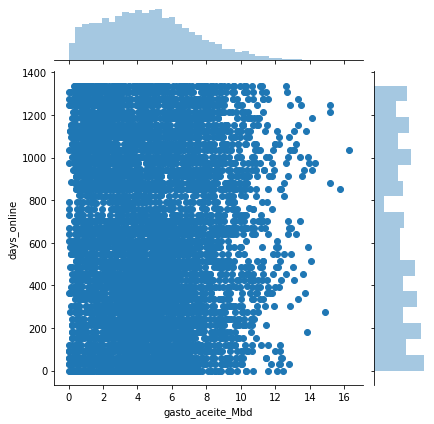

In [11]:
sns.jointplot(to_plot2.gasto_aceite_Mbd,to_plot2.days_online)

/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


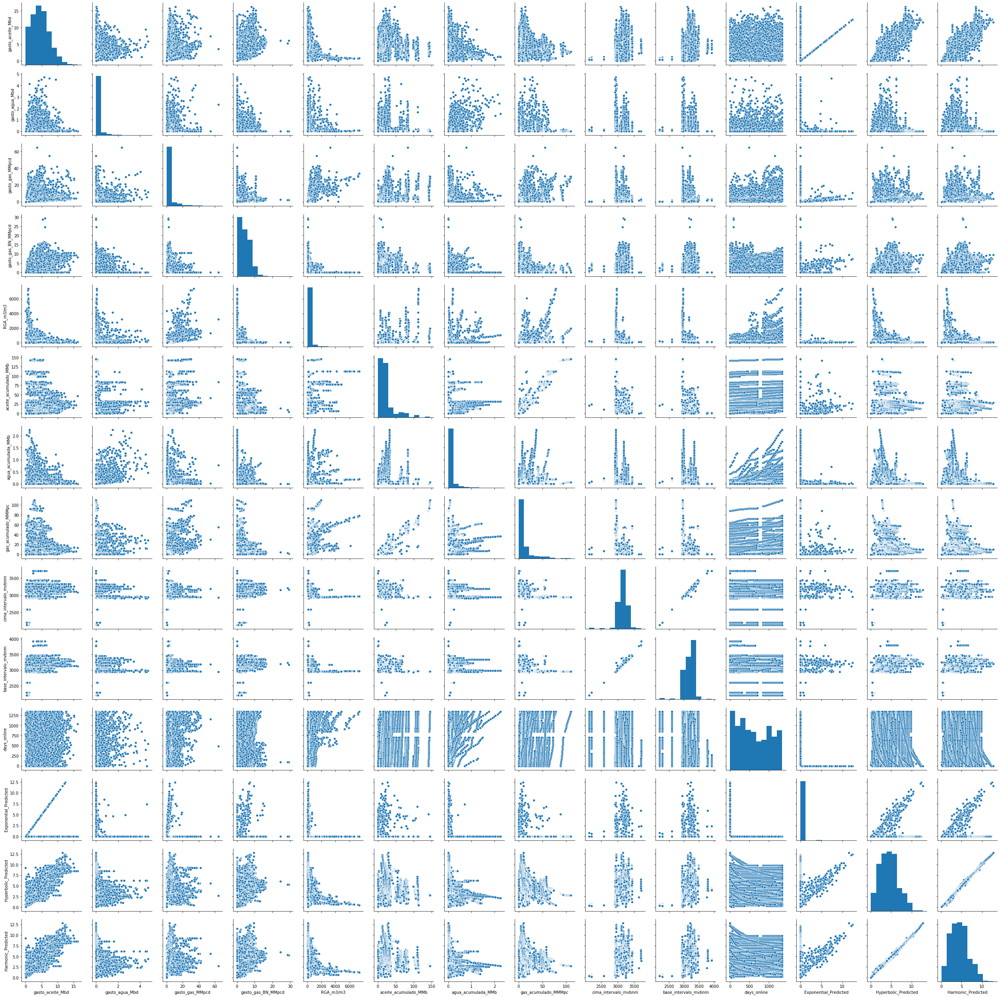

In [12]:
sns.pairplot(to_plot)

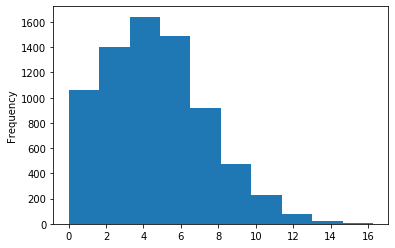

In [13]:
df.gasto_aceite_Mbd.plot.hist()

In [14]:
display(df.head(),df.shape)
unique_well_list=pd.unique(list(df.pozo))
display(unique_well_list.shape, len(unique_well_list))

,Unnamed: 0,fecha,campo,yacimiento,plataforma,pozo,inicio_produccion_aceite,ultima_produccion_aceite,gasto_aceite_Mbd,gasto_agua_Mbd,gasto_gas_MMpcd,gasto_gas_BN_MMpcd,RGA_m3/m3,aceite_acumulado_MMb,agua_acumulada_MMb,gas_acumulado_MMMpc,cima_intervalo_mvbnm,base_intervalo_mvbnm,distancia_superior_intervalo_a_contacto_gas-aceite_(m),fluyente_BEC_o _BN,RGA_pc/bl,nivel_CGA,cima_mv -nivel_CGA,estatus,arriba_abajo_CGA,campo_yacimiento,first_oil,Dias Produciendo,days_online,Exponential_Predicted,Hyperbolic_Predicted,Harmonic_Predicted
0,0,2016-01-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/01/16,1.22,0.01,2.30,1.79,nan,9.93,0.13,5.87,"2,585.00","2,603.00",-,BN,"1,889.96",2919.2,-334.2,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,0,0,1.22,0.60,0.61
1,178,2016-02-29,KU,KU_CCE,KU-A,KU-10,02/28/86,29/02/16,0.15,0.01,0.28,0.40,331.05,9.93,0.13,5.87,"2,585.00","2,603.00",-,BN,"1,858.69",2924.518217,-339.518217,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,29,29,0.00,0.60,0.60
2,357,2016-03-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/03/16,0.44,0.10,0.90,2.05,367.06,9.94,0.14,5.90,"2,585.00","2,603.00",-,BN,"2,060.87",2918.6,-333.6,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,60,60,0.00,0.59,0.59
3,538,2016-04-30,KU,KU_CCE,KU-A,KU-10,02/28/86,30/04/16,0.44,0.03,0.97,1.81,389.10,9.96,0.14,5.93,"2,585.00","2,603.00",-,BN,"2,184.62",2918.6,-333.6,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,90,90,0.00,0.59,0.59
4,719,2016-05-31,KU,KU_CCE,KU-A,KU-10,02/28/86,31/05/16,0.45,0.07,0.98,2.61,388.96,9.97,0.14,5.96,"2,585.00","2,603.00",-,BN,"2,183.85",2923.5,-338.5,OPERANDO,ARRIBA,Ku-Crétacico,2016-01-31,121,121,0.00,0.58,0.58


(7328, 32)

(222,)

222

count   7,328.00
mean        4.66
std         2.72
min         0.00
25%         2.57
50%         4.46
75%         6.37
max        16.27
Name: gasto_aceite_Mbd, dtype: float64

0.10   1.20
0.50   4.46
0.90   8.36
Name: gasto_aceite_Mbd, dtype: float64

count   7,328.00
mean        4.45
std         2.23
min         0.03
25%         2.77
50%         4.30
75%         5.74
max        12.80
Name: Hyperbolic_Predicted, dtype: float64

0.10   1.70
0.50   4.30
0.90   7.53
Name: Hyperbolic_Predicted, dtype: float64

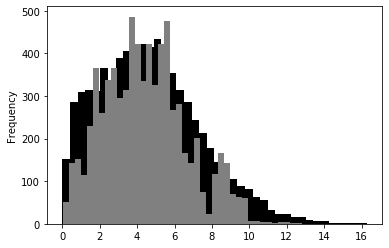

In [15]:
display(df.gasto_aceite_Mbd.describe(),
        df.gasto_aceite_Mbd.quantile([.1,.5,.9]),
        df.Hyperbolic_Predicted.describe(),
        df.Hyperbolic_Predicted.quantile([.1,.5,.9]))
df.gasto_aceite_Mbd.plot.hist(bins=40,color='black'),
df.Hyperbolic_Predicted.plot.hist(bins=40,color='gray')

count   7,328.00
mean        3.66
std         5.25
min         0.00
25%         1.24
50%         2.12
75%         3.52
max        64.57
Name: gasto_gas_MMpcd, dtype: float64

0.10   0.65
0.50   2.12
0.90   7.48
Name: gasto_gas_MMpcd, dtype: float64

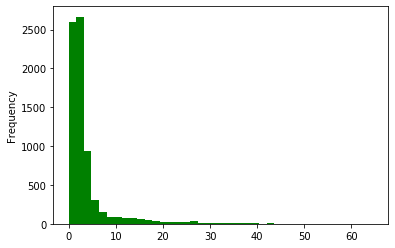

In [16]:
display(df.gasto_gas_MMpcd.describe(),
       df.gasto_gas_MMpcd.quantile([.1,.5,.9]))
df.gasto_gas_MMpcd.plot.hist(bins=40,color='green')

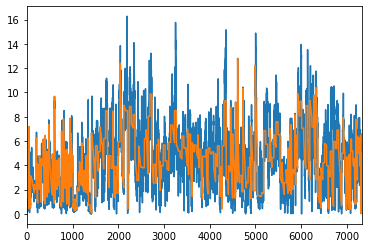

In [17]:
df.gasto_aceite_Mbd.plot()
df.Hyperbolic_Predicted.plot()

In [18]:
class Distribution(object):
    
    def __init__(self,dist_names_list = []):
        self.dist_names = ['beta',
                            'expon',
                            'gamma',
                            'lognorm',
                            'norm',
                            'pearson3',
                            'triang',
                            'uniform',
                            'weibull_min', 
                            'weibull_max']
        self.dist_results = []
        self.params = {}
        
        self.DistributionName = ""
        self.PValue = 0
        self.Param = None
        
        self.isFitted = False
        
        
    def Fit(self, y):
        self.dist_results = []
        self.params = {}
        for dist_name in self.dist_names:
            dist = getattr(scipy.stats, dist_name)
            param = dist.fit(y)
            
            self.params[dist_name] = param
            #Applying the Kolmogorov-Smirnov test
            D, p = scipy.stats.kstest(y, dist_name, args=param);
            self.dist_results.append((dist_name,p))
        #select the best fitted distribution
        sel_dist,p = (max(self.dist_results,key=lambda item:item[1]))
        #store the name of the best fit and its p value
        self.DistributionName = sel_dist
        self.PValue = p
        
        self.isFitted = True
        return self.DistributionName,self.PValue
    
    def Random(self, n = 1):
        if self.isFitted:
            dist_name = self.DistributionName
            param = self.params[dist_name]
            #initiate the scipy distribution
            dist = getattr(scipy.stats, dist_name)
            return dist.rvs(*param[:-2], loc=param[-2], scale=param[-1], size=n)
        else:
            raise ValueError('Must first run the Fit method.')
            
    def Plot(self,y):
        x = self.Random(n=len(y))
        fig, ax = plt.subplots(figsize=(16,8))
        plt.hist(x, alpha=0.5, label='Fitted',bins=50)
        plt.hist(y, alpha=0.5, label='Actual',bins=50)
        plt.legend(loc='upper right')

# Estadística CAMPOS

In [19]:
import timeit
tic=timeit.default_timer()

mx_stats=pd.read_csv(r'/Users/fffte/ainda_drive/python/csv/benchmark/mexico/pozos/mx_benchmark.csv',
                    low_memory=False)

display(mx_stats.shape)

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

(2838332, 10)

4.190026778000004

In [20]:
input_campo = input("Nombre de Campo: ")

Nombre de Campo: CORRALILLO


In [21]:
import timeit
tic=timeit.default_timer()

selected_rows=mx_stats.pozo.str.contains(str(input_campo))
campo=mx_stats.loc[selected_rows]

unique_well_list=pd.unique(campo['pozo'])

display('Número de pozos en:',
        input_campo,
        len(unique_well_list),
        unique_well_list,
        campo.shape)


toc=timeit.default_timer()
toc - tic #elapsed time in seconds

'Número de pozos en:'

'CORRALILLO'

252

array(['CORRALILLO-157', 'CORRALILLO-1601', 'CORRALILLO-1612',
       'CORRALILLO-1632', 'CORRALILLO-1651', 'CORRALILLO-1655',
       'CORRALILLO-1695', 'CORRALILLO-2', 'CORRALILLO-301',
       'CORRALILLO-302', 'CORRALILLO-303', 'CORRALILLO-304',
       'CORRALILLO-305', 'CORRALILLO-3067', 'CORRALILLO-307',
       'CORRALILLO-309', 'CORRALILLO-3101', 'CORRALILLO-3103',
       'CORRALILLO-3107', 'CORRALILLO-311', 'CORRALILLO-3113',
       'CORRALILLO-3116', 'CORRALILLO-3119', 'CORRALILLO-312',
       'CORRALILLO-3123', 'CORRALILLO-3135', 'CORRALILLO-314',
       'CORRALILLO-3143', 'CORRALILLO-3144', 'CORRALILLO-3157',
       'CORRALILLO-316', 'CORRALILLO-3163', 'CORRALILLO-3165',
       'CORRALILLO-3166', 'CORRALILLO-3167', 'CORRALILLO-3169',
       'CORRALILLO-3179', 'CORRALILLO-3183', 'CORRALILLO-3189',
       'CORRALILLO-319', 'CORRALILLO-3204', 'CORRALILLO-3206',
       'CORRALILLO-3212', 'CORRALILLO-3214', 'CORRALILLO-3218',
       'CORRALILLO-3226', 'CORRALILLO-323', 'CORRALILLO-

(20353, 10)

1.5551558399999976

In [22]:
import timeit
tic=timeit.default_timer()

display(campo.aceite_Mbd.quantile([.1,.5,.9]))
display(campo.describe())

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

0.10   0.01
0.50   0.02
0.90   0.09
Name: aceite_Mbd, dtype: float64

,Unnamed: 0,aceite_Mbd,agua_Mbd,condensado_Mbd,gas_asociado_MMpcd,gas_no_asociado_MMpcd
count,"20,353.00","20,353.00","20,353.00","20,353.00","20,353.00","20,353.00"
mean,"491,953.86",0.04,0.01,0.00,0.12,0.00
std,"392,346.96",0.07,0.02,0.00,0.17,0.00
min,"2,001.00",0.00,0.00,0.00,0.00,0.00
25%,"104,716.00",0.01,0.00,0.00,0.03,0.00
50%,"456,328.00",0.02,0.00,0.00,0.07,0.00
75%,"889,237.00",0.04,0.01,0.00,0.15,0.00
max,"998,143.00",1.49,0.81,0.00,2.78,0.00


0.08443417099999806

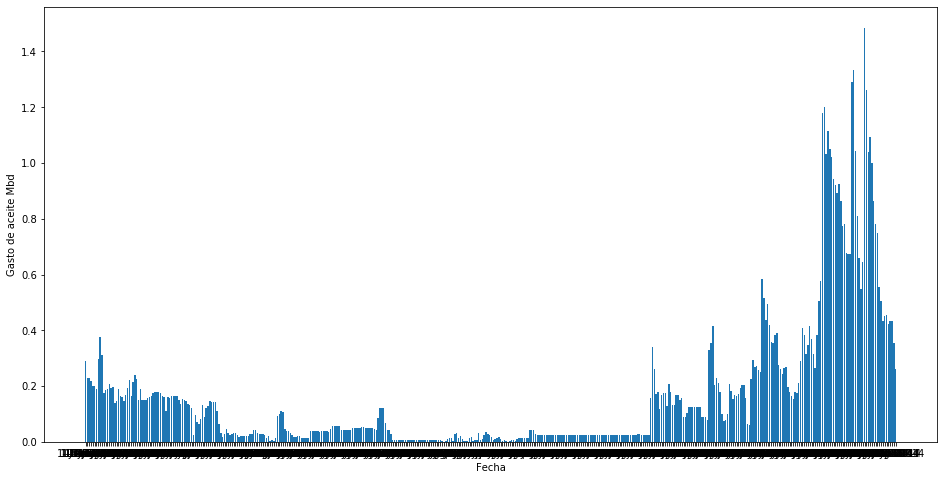

399.36629944399994

In [23]:
import timeit
tic=timeit.default_timer()

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(campo.fecha,campo.aceite_Mbd)
ax.set_xlabel('Fecha')
ax.set_ylabel('Gasto de aceite Mbd')
plt.show()

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

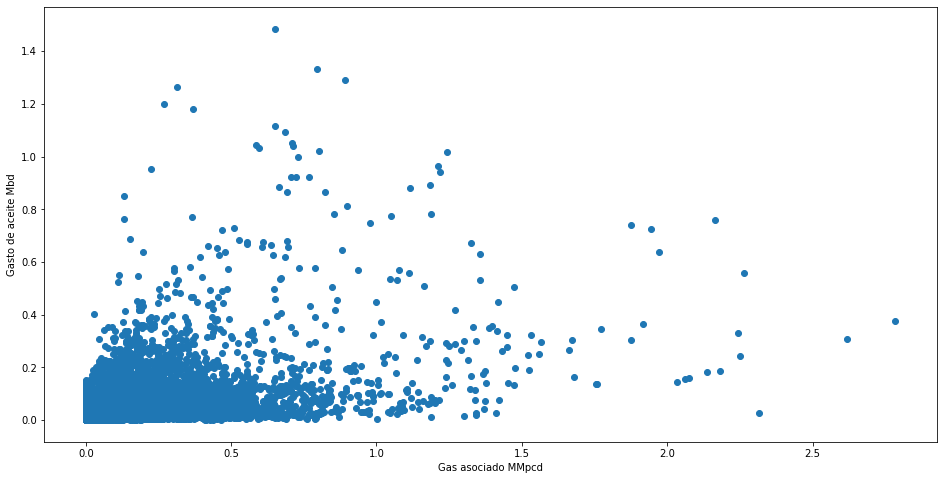

0.6833210219999728

In [24]:
import timeit
tic=timeit.default_timer()

fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(campo.gas_asociado_MMpcd,campo.aceite_Mbd)
ax.set_xlabel('Gas asociado MMpcd')
ax.set_ylabel('Gasto de aceite Mbd')
plt.show()


toc=timeit.default_timer()
toc - tic #elapsed time in seconds

2.0701041410000016

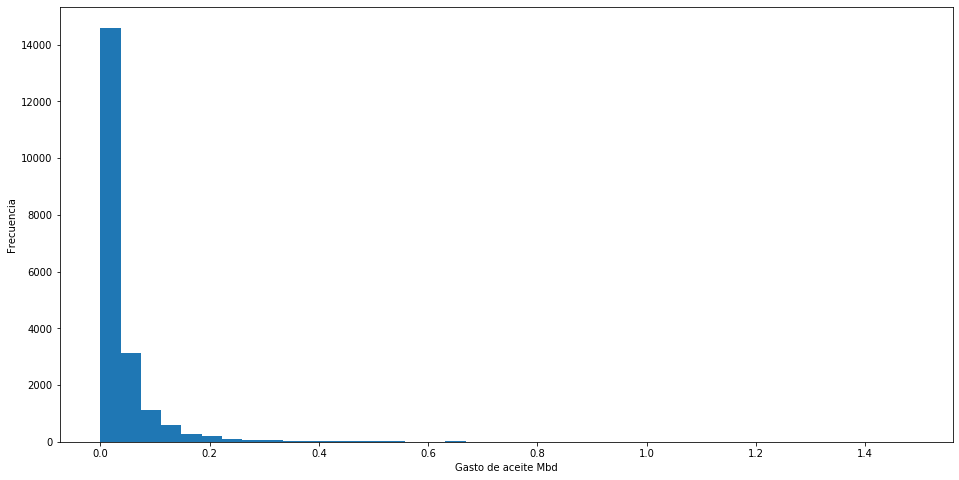

In [25]:
import timeit
tic=timeit.default_timer()

fig, ax = plt.subplots(figsize=(16,8))
ax.hist(campo.aceite_Mbd,
        bins=40,
        cumulative=False,
        density=False)
ax.set_xlabel('Gasto de aceite Mbd')
ax.set_ylabel('Frecuencia')

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:515: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:162: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


('lognorm', 1.411143882129317e-36)

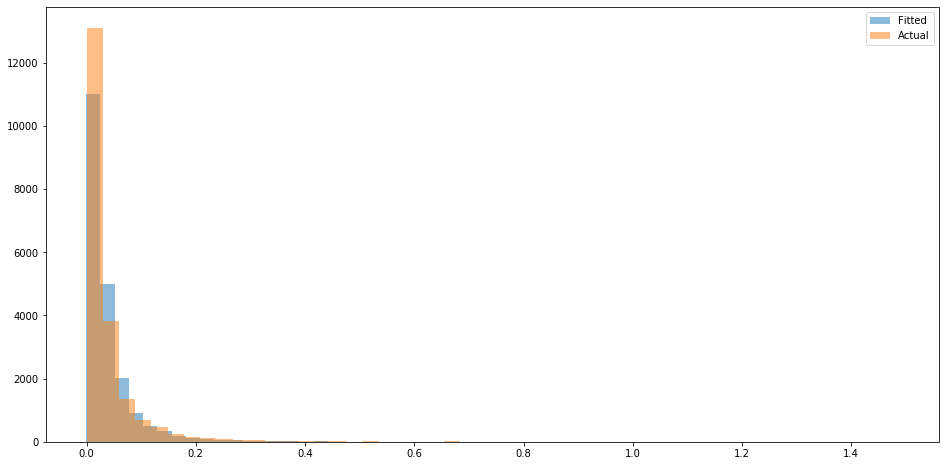

In [26]:
dst=Distribution()
display(dst.Fit(campo.aceite_Mbd))
dst.Plot(campo.aceite_Mbd)

## Q inicial

In [27]:
def get_max_initial_production(df, variable_column, well_column, date_column):
    global df_beginning_production
    global field
    """
    This function allows you to look at the first X months of production, and selects 
    the highest production month as max initial production
    Arguments:
        df: Pandas dataframe. 
        number_first_months: float. Number of months from the point the well comes online
        to compare to get the max initial production rate qi (this looks at multiple months
        in case there is a production ramp-up)
        variable_column: String. Column name for the column where we're attempting to get
        the max volume from (can be either 'Gas' or 'Oil' in this script)
        date_column: String. Column name for the date that the data was taken at 
    """
    #First, sort the data frame from earliest to most recent prod date
    field=campo.sort_values(by=[date_column,well_column])
    num_months=int((len(field))*.20)
    #Pull out the first x months of production, where number_first_months is x
    df_beginning_production=field.head(num_months)
    #Return the max value in the selected variable column from the newly created 
    #df_beginning_production df
    return df_beginning_production[variable_column].max(), num_months, field.shape

In [28]:
get_max_initial_production(campo,'aceite_Mbd','pozo','fecha')

(1.333515, 4070, (20353, 10))

In [29]:
df_beginning_production.shape

(4070, 10)

In [30]:
for unique_well_list in field:
    display(get_max_initial_production)

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

<function __main__.get_max_initial_production(df, variable_column, well_column, date_column)>

# Función Estadística Campos

In [70]:
def estadistica_campo():
    global campo
    global unique_well_list
    global input_campo
    
    tic=timeit.default_timer()
    
    mx_stats=pd.read_csv(r'/Users/fffte/ainda_drive/python/csv/benchmark/mexico/pozos/mx_benchmark.csv',
                         index_col=0,
                        low_memory=False)
    
    display('Numero de datos en base: '+str(len(mx_stats)))

    display(mx_stats.shape)
    
    input_campo = input("Nombre de Campo: ")
    
    selected_rows=mx_stats.pozo.str.contains(str(input_campo))
    campo=mx_stats.loc[selected_rows]

    display(campo.head(),campo.shape)
    
    unique_well_list=pd.unique(campo['pozo'])

    display('Número de pozos en:',
            input_campo,
            len(unique_well_list),
            unique_well_list,
            campo.shape)

    display(campo.aceite_Mbd.quantile([.1,.5,.9]),
            campo.describe())

    #fig1, ax1 = plt.subplots(figsize=(16,8))
    #ax1.bar(campo.fecha,campo.aceite_Mbd)
    #ax1.set_xlabel('Fecha')
    #ax1.set_ylabel('Gasto de aceite Mbd')
    #plt.show()

    #fig2, ax2 = plt.subplots(figsize=(16,8))
    #ax2.scatter(campo.fecha,campo.aceite_Mbd)
    #ax2.set_xlabel('Fecha')
    #ax2.set_ylabel('Gasto de aceite Mbd')
    #plt.show()

    #fig3, ax3 = plt.subplots(figsize=(16,8))
    #ax3.hist(campo.aceite_Mbd,
            #bins=40,
            #cumulative=False,
            #density=False)
    #ax3.set_xlabel('Gasto de aceite Mbd')
    #ax3.set_ylabel('Frecuencia')
    

    dst=Distribution()
    display(dst.Fit(campo.aceite_Mbd))
    dst.Plot(campo.aceite_Mbd)
    
    campo.to_csv(r'/Users/fffte/ainda_drive/python/csv/benchmark/'+str(input_campo)+str('.csv'))
    
    toc=timeit.default_timer()
    tac= toc - tic #elapsed time in seconds
    
    return display('Tiempo de procesamiento: ' +str(tac))

'Numero de datos en base: 2838332'

(2838332, 9)

Nombre de Campo: MIQUETLA


,aceite_Mbd,agua_Mbd,asignacion,condensado_Mbd,cuenca,fecha,gas_asociado_MMpcd,gas_no_asociado_MMpcd,pozo
3513,0.01,0.00,NaN,0.00,Tampico-Misantla,1-Dec-2014,0.01,0.00,MIQUETLA-102
3514,0.01,0.00,NaN,0.00,Tampico-Misantla,1-Dec-2014,0.02,0.00,MIQUETLA-103
3515,0.00,0.00,NaN,0.00,Tampico-Misantla,1-Dec-2014,0.01,0.00,MIQUETLA-104
3516,0.01,0.00,NaN,0.00,Tampico-Misantla,1-Dec-2014,0.04,0.00,MIQUETLA-105
3517,0.01,0.00,NaN,0.00,Tampico-Misantla,1-Dec-2014,0.02,0.00,MIQUETLA-106


(24691, 9)

'Número de pozos en:'

'MIQUETLA'

137

array(['MIQUETLA-102', 'MIQUETLA-103', 'MIQUETLA-104', 'MIQUETLA-105',
       'MIQUETLA-106', 'MIQUETLA-107', 'MIQUETLA-108', 'MIQUETLA-109',
       'MIQUETLA-111', 'MIQUETLA-112', 'MIQUETLA-114', 'MIQUETLA-116',
       'MIQUETLA-121', 'MIQUETLA-122', 'MIQUETLA-124', 'MIQUETLA-15',
       'MIQUETLA-17', 'MIQUETLA-19', 'MIQUETLA-2', 'MIQUETLA-20',
       'MIQUETLA-22', 'MIQUETLA-23A', 'MIQUETLA-24', 'MIQUETLA-26',
       'MIQUETLA-27', 'MIQUETLA-28', 'MIQUETLA-29', 'MIQUETLA-3',
       'MIQUETLA-3134', 'MIQUETLA-32', 'MIQUETLA-33', 'MIQUETLA-3371',
       'MIQUETLA-35', 'MIQUETLA-356', 'MIQUETLA-36', 'MIQUETLA-39',
       'MIQUETLA-4', 'MIQUETLA-43', 'MIQUETLA-45', 'MIQUETLA-46',
       'MIQUETLA-47', 'MIQUETLA-51', 'MIQUETLA-52', 'MIQUETLA-57',
       'MIQUETLA-58', 'MIQUETLA-60', 'MIQUETLA-61', 'MIQUETLA-63',
       'MIQUETLA-64', 'MIQUETLA-66', 'MIQUETLA-677', 'MIQUETLA-67A',
       'MIQUETLA-73', 'MIQUETLA-744', 'MIQUETLA-78', 'MIQUETLA-79',
       'MIQUETLA-80', 'MIQUETLA-81', 'MIQ

(24691, 9)

0.10   0.00
0.50   0.01
0.90   0.04
Name: aceite_Mbd, dtype: float64

,aceite_Mbd,agua_Mbd,condensado_Mbd,gas_asociado_MMpcd,gas_no_asociado_MMpcd
count,"24,691.00","24,691.00","24,691.00","24,691.00","24,691.00"
mean,0.02,0.00,0.00,0.04,0.00
std,0.03,0.01,0.00,0.07,0.04
min,0.00,0.00,0.00,0.00,0.00
25%,0.01,0.00,0.00,0.01,0.00
50%,0.01,0.00,0.00,0.02,0.00
75%,0.03,0.00,0.00,0.05,0.00
max,0.72,0.38,0.00,1.06,1.69


('lognorm', 4.987298569425703e-19)

'Tiempo de procesamiento: 11.757796634999977'

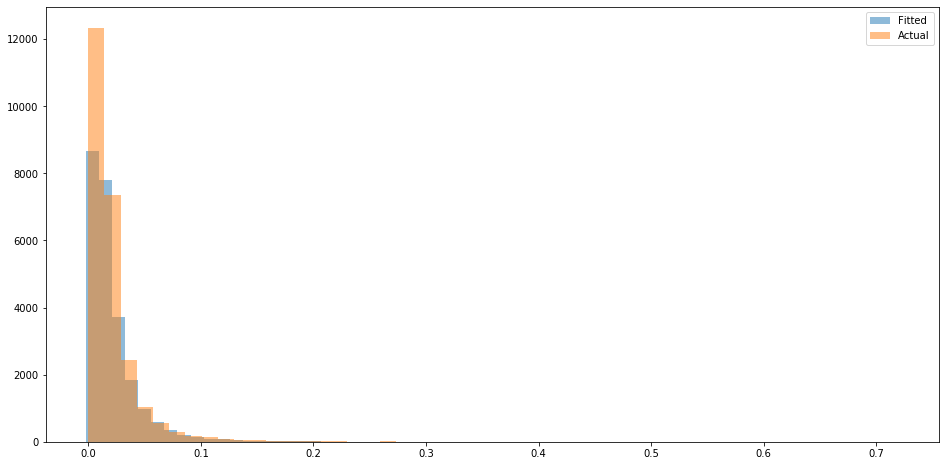

In [71]:
estadistica_campo()

# DCA

Exponential Fit Curve-fitted Variables: qi=0.0521445, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0125607205554013, b=1.9999999999999998, di=8.433115187696072e-06
Harmonic Fit Curve-fitted Variables: qi=0.012279511114295996, di=5.334345658945982e-06


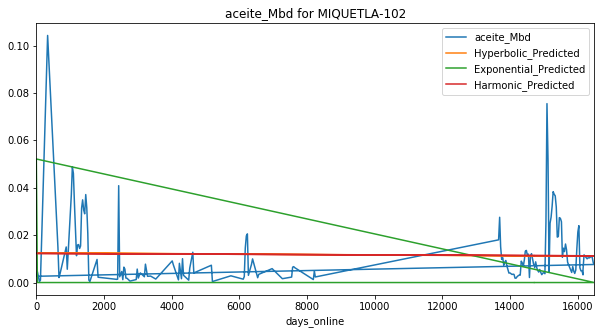

Exponential Fit Curve-fitted Variables: qi=0.068579, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11801254322991506, b=1.0944227539100899e-07, di=0.00015161603696748005
Harmonic Fit Curve-fitted Variables: qi=0.12660250879956217, di=0.00039096111648890197


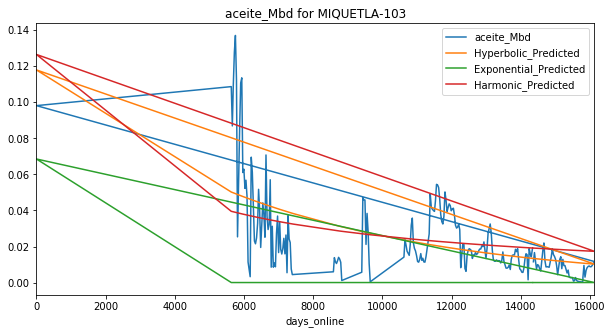

Exponential Fit Curve-fitted Variables: qi=0.044552999999999995, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08885970958453894, b=0.8822765647670441, di=0.0003689337977661919
Harmonic Fit Curve-fitted Variables: qi=0.08910589962249983, di=0.0004204748439248775


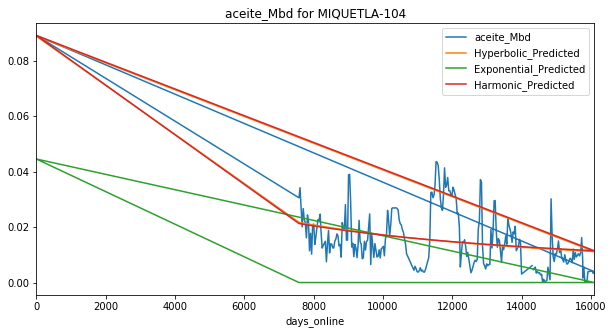

Exponential Fit Curve-fitted Variables: qi=0.0812435, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09864588240920992, b=1.3923079357708945, di=0.0011690277674660046
Harmonic Fit Curve-fitted Variables: qi=0.09753634396974402, di=0.000667723852160542


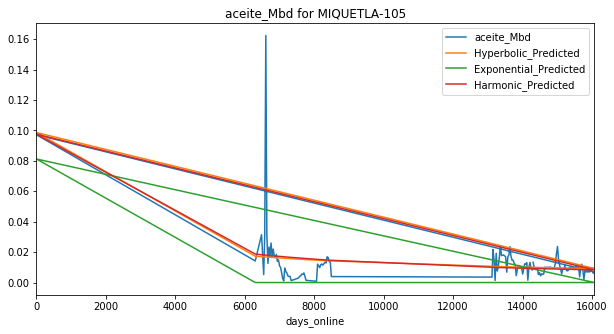

Exponential Fit Curve-fitted Variables: qi=0.044657499999999996, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08931496527225037, b=1.9999999588112294, di=0.0018039663819358785
Harmonic Fit Curve-fitted Variables: qi=0.0863267757788068, di=0.0004926999733315767


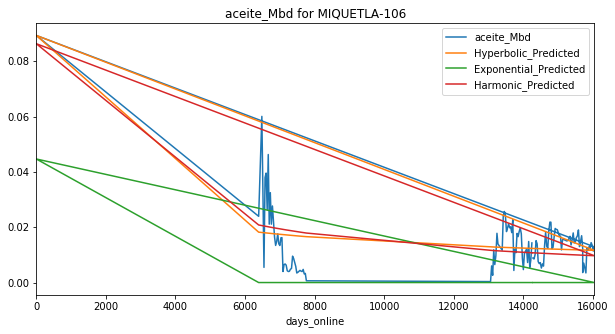

Exponential Fit Curve-fitted Variables: qi=0.067869, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.05972932409669717, b=1.9999999999999998, di=0.0007404893892959083
Harmonic Fit Curve-fitted Variables: qi=0.04296479401849453, di=0.0001739857575290653


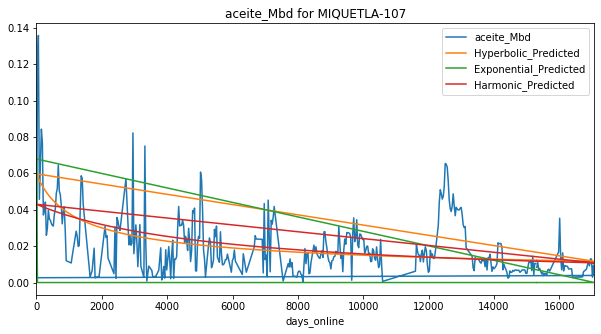

Exponential Fit Curve-fitted Variables: qi=0.0396665, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04407432295379915, b=1.0248790682908298, di=0.0005297424714087513
Harmonic Fit Curve-fitted Variables: qi=0.043949741123042896, di=0.0005189743324379085


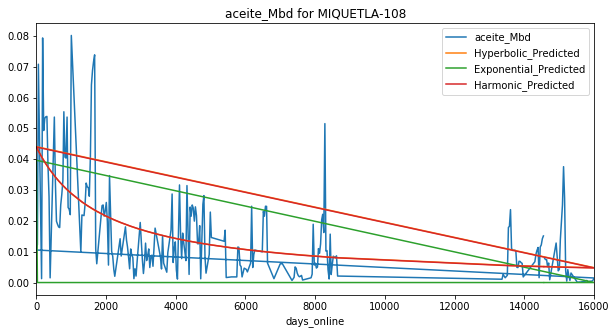

Exponential Fit Curve-fitted Variables: qi=0.046739499999999996, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09347899999718147, b=1.9999999999995386, di=0.0017916738260721496
Harmonic Fit Curve-fitted Variables: qi=0.08714465087933425, di=0.00044727079582643225


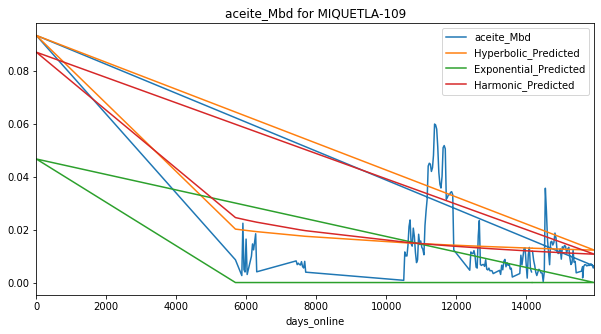

Exponential Fit Curve-fitted Variables: qi=0.0452865, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09057299997726183, b=1.999999999999963, di=0.006831110307605227
Harmonic Fit Curve-fitted Variables: qi=0.0170182486871041, di=4.758498414424428e-05


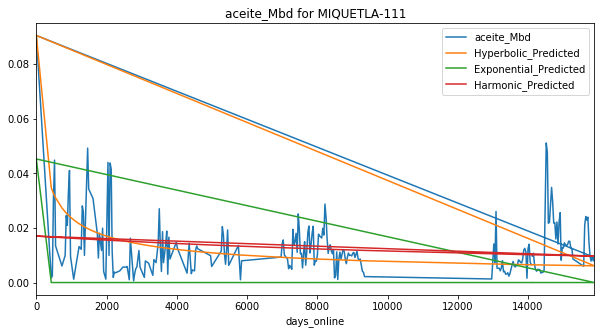

Exponential Fit Curve-fitted Variables: qi=0.058495000000000005, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08445719432320618, b=1.5693226030280134, di=0.0018865204058143119
Harmonic Fit Curve-fitted Variables: qi=0.07171367479831366, di=0.0008624234313751554


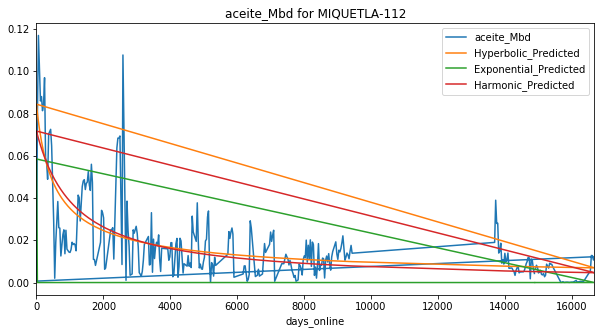

Exponential Fit Curve-fitted Variables: qi=0.0182605, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.023863167540633133, b=1.9999999999999991, di=0.00043654154732141045
Harmonic Fit Curve-fitted Variables: qi=0.017332793648069767, di=0.00012057370491961259


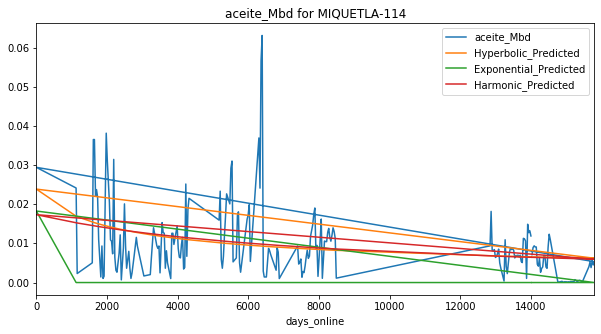

Exponential Fit Curve-fitted Variables: qi=0.0254635, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.018235510636766948, b=2.667486641573816e-07, di=2.6390676519684033e-05
Harmonic Fit Curve-fitted Variables: qi=0.018450553956001835, di=3.2395448332526164e-05


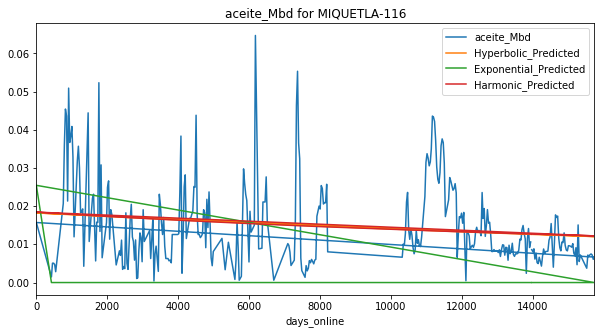

Exponential Fit Curve-fitted Variables: qi=0.028710000000000006, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.057420000000000006, b=1.6658302833686511, di=0.0024990536938940917
Harmonic Fit Curve-fitted Variables: qi=0.05741972614887473, di=0.0008313637348386624


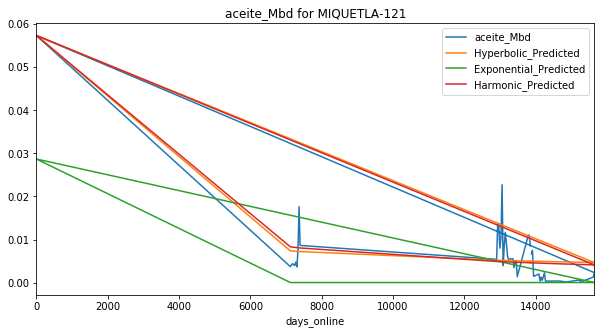

Exponential Fit Curve-fitted Variables: qi=0.043014, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.046073848698637, b=1.9999999999999998, di=0.00014374552224581994
Harmonic Fit Curve-fitted Variables: qi=0.0385312212982809, di=5.521342358296149e-05


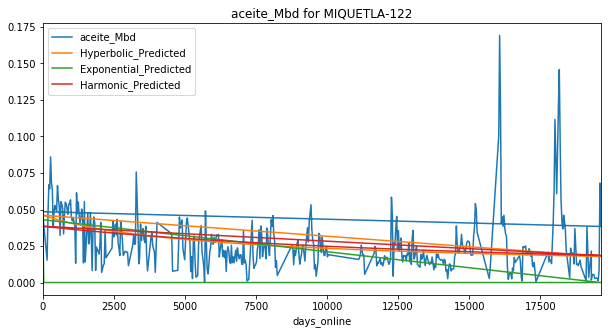

Exponential Fit Curve-fitted Variables: qi=0.026579500000000002, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.036868644522764234, b=1.9426319786114892, di=0.0004107576923087844
Harmonic Fit Curve-fitted Variables: qi=0.03361019787269465, di=0.00019584142388172552


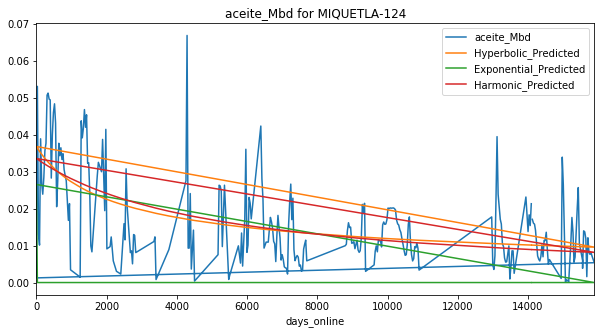

Exponential Fit Curve-fitted Variables: qi=0.08004299999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16008599994898268, b=9.866928063668064e-12, di=0.0002840269389533711
Harmonic Fit Curve-fitted Variables: qi=0.16008599999999873, di=0.0006685513491505535


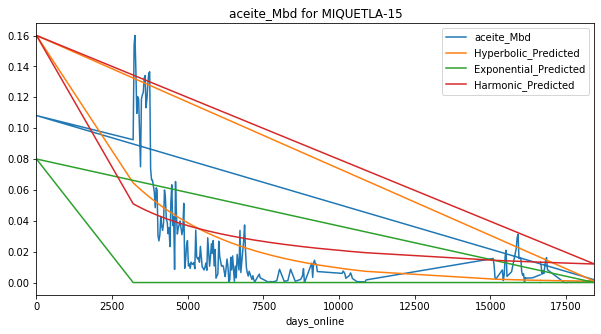

Exponential Fit Curve-fitted Variables: qi=0.032497500000000006, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06074100339087068, b=1.9999999999999998, di=0.0011935647133419433
Harmonic Fit Curve-fitted Variables: qi=0.016924267788412366, di=1.9464207834013124e-05


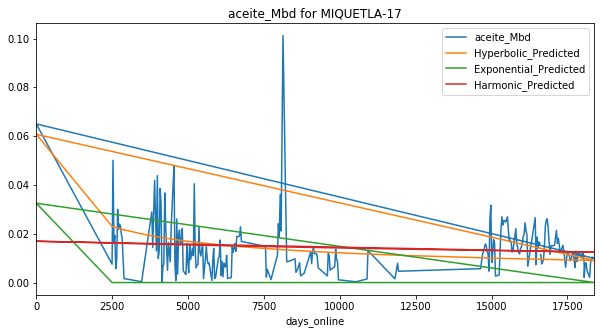

Exponential Fit Curve-fitted Variables: qi=0.1684045, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3355222771626777, b=1.074947797493054, di=0.0012150450608480496
Harmonic Fit Curve-fitted Variables: qi=0.3307344585738596, di=0.0010856607054968547


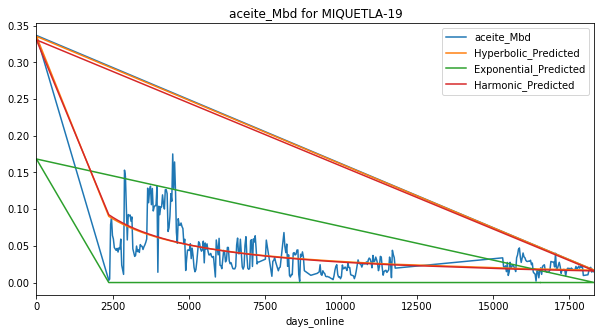

Exponential Fit Curve-fitted Variables: qi=0.0229275, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.020532112989431212, b=1.966162640396619e-05, di=1.551268217860034e-05
Harmonic Fit Curve-fitted Variables: qi=0.020518233595323534, di=1.6977082843274934e-05


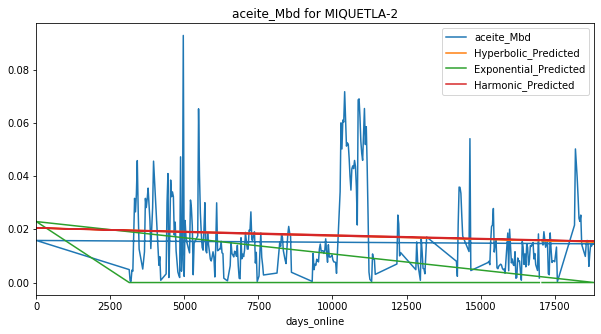

Exponential Fit Curve-fitted Variables: qi=0.11017650000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.220353, b=0.48447207673808557, di=0.0008017149994680153
Harmonic Fit Curve-fitted Variables: qi=0.2203529999999817, di=0.0015153162108372334


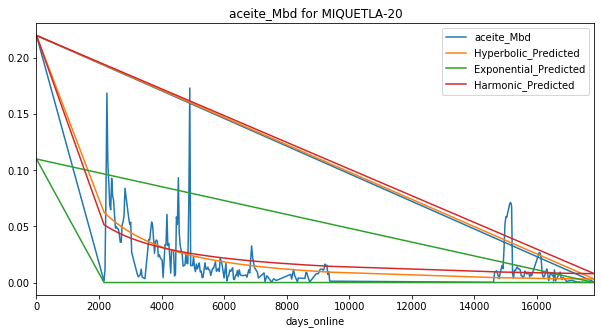

Exponential Fit Curve-fitted Variables: qi=0.188799, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.37759799999999993, b=0.9569745092128985, di=0.002438886482898228
Harmonic Fit Curve-fitted Variables: qi=0.37759799999999993, di=0.002632575390992594


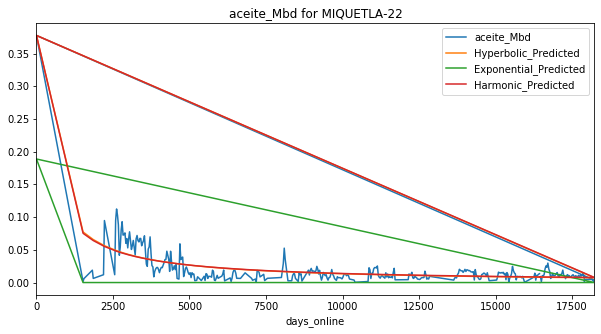

Exponential Fit Curve-fitted Variables: qi=0.146796, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.293591999999892, b=0.8031175793109262, di=0.001354421567096446
Harmonic Fit Curve-fitted Variables: qi=0.2935919999999857, di=0.0019027648845321194


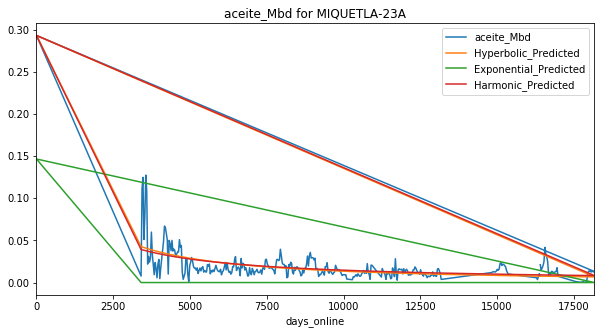

Exponential Fit Curve-fitted Variables: qi=0.085811, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.17162199999999986, b=1.9999999999999982, di=0.010850872519575195
Harmonic Fit Curve-fitted Variables: qi=0.167885280211286, di=0.001953384574407068


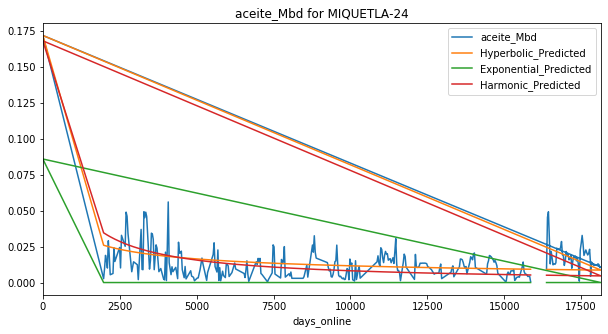

Exponential Fit Curve-fitted Variables: qi=0.1569305, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3138609999999972, b=1.999999999999998, di=0.0043828777335356535
Harmonic Fit Curve-fitted Variables: qi=0.3130705949959774, di=0.000758371325430357


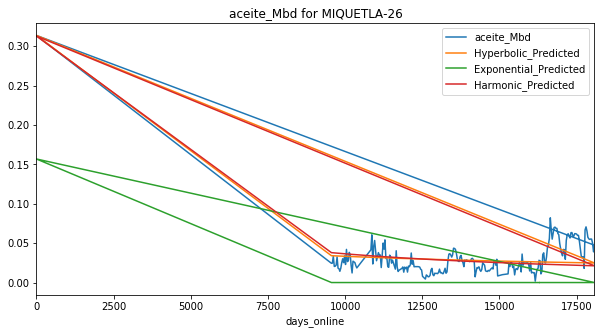

Exponential Fit Curve-fitted Variables: qi=0.180578, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.36115599999965287, b=0.8849967727450634, di=0.000895221489549763
Harmonic Fit Curve-fitted Variables: qi=0.3611559961308155, di=0.0011124472758508518


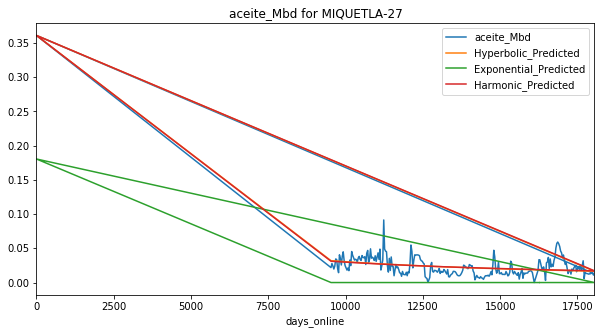

Exponential Fit Curve-fitted Variables: qi=0.11122449999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.22244899999938794, b=1.6834988225989476, di=0.0014046499319065604
Harmonic Fit Curve-fitted Variables: qi=0.22244899999999995, di=0.000526847713842711


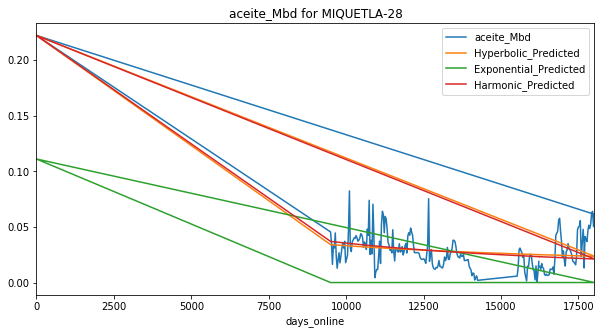

Exponential Fit Curve-fitted Variables: qi=0.12873800000000002, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.25747599999999793, b=1.8612986265593552, di=0.00958465786702788
Harmonic Fit Curve-fitted Variables: qi=0.2565680795494704, di=0.0022223920808936027


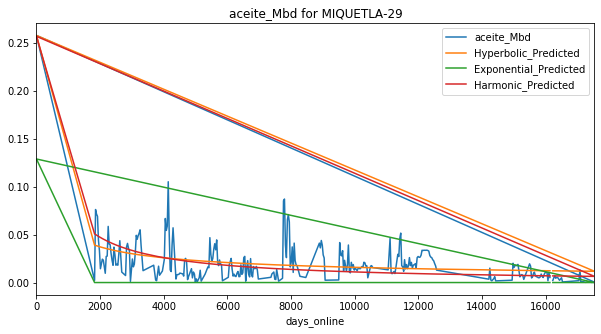

Exponential Fit Curve-fitted Variables: qi=0.107346, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2146919945126886, b=1.2526191121393682, di=0.0013499274198249984
Harmonic Fit Curve-fitted Variables: qi=0.20382328583374082, di=0.0008959166515903552


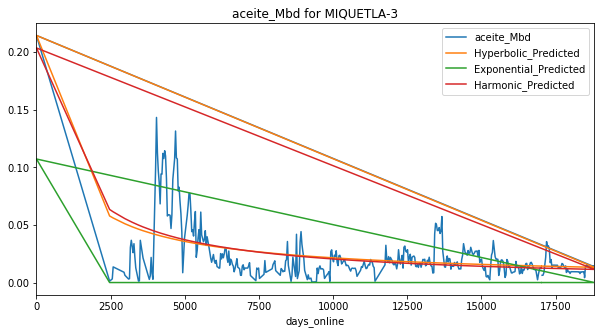

Exponential Fit Curve-fitted Variables: qi=0.0175085, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.025572022936763278, b=1.9999999999999998, di=0.0014093585609314468
Harmonic Fit Curve-fitted Variables: qi=0.022177582165457996, di=0.0006221806138690503


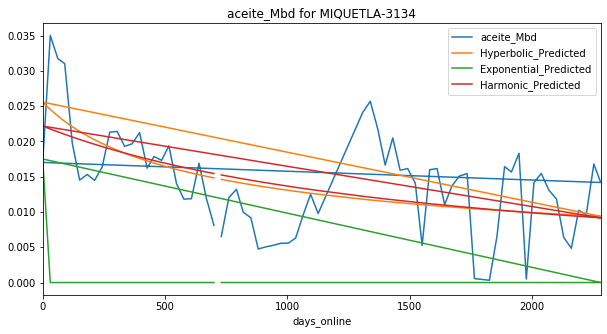

Exponential Fit Curve-fitted Variables: qi=0.1604915, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3209829998299561, b=1.6779590539442302, di=0.006259275941785613
Harmonic Fit Curve-fitted Variables: qi=0.3209829999999524, di=0.0014281448123001752


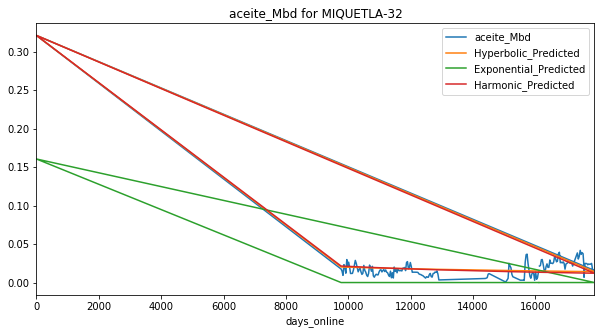

Exponential Fit Curve-fitted Variables: qi=0.13869, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.27737999999999996, b=2.971541903918136e-15, di=0.00040211593941785214
Harmonic Fit Curve-fitted Variables: qi=0.2773799999999748, di=0.001337230201694454


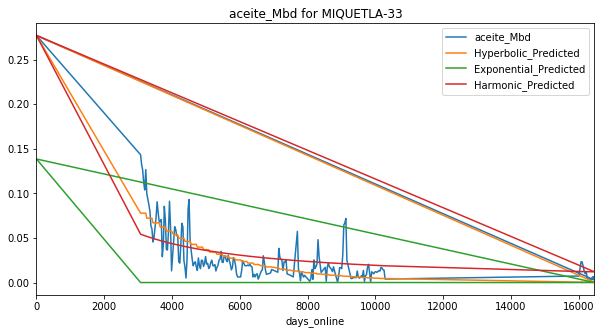

Exponential Fit Curve-fitted Variables: qi=0.016281, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.01935970428910131, b=1.9999999999999998, di=0.00043361941522454295
Harmonic Fit Curve-fitted Variables: qi=0.01704921666332117, di=0.00019317079599683363


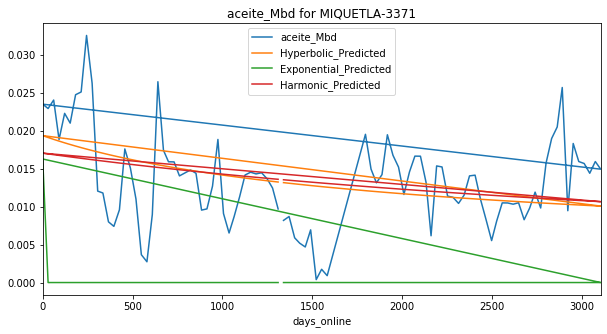

Exponential Fit Curve-fitted Variables: qi=0.1460855, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.29217099999999996, b=1.103916704665867, di=0.0015664675858127885
Harmonic Fit Curve-fitted Variables: qi=0.2903247716849343, di=0.0013775263248039455


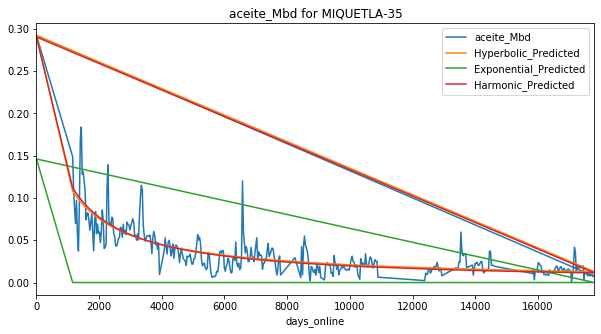

Exponential Fit Curve-fitted Variables: qi=0.010034, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.016434235326285372, b=2.2370276754596548e-11, di=0.00010714753388996706
Harmonic Fit Curve-fitted Variables: qi=0.016236702946363736, di=0.00010580788242824415


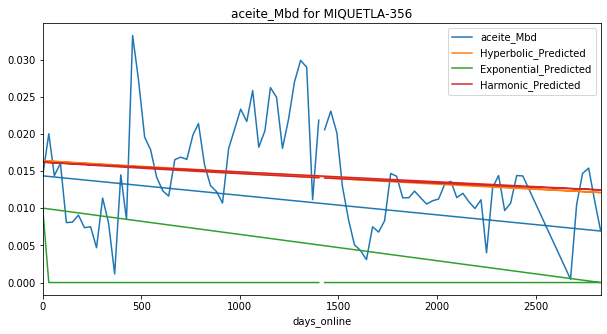

Exponential Fit Curve-fitted Variables: qi=0.133209, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2664179999999935, b=1.624187142352773, di=0.003672668100916543
Harmonic Fit Curve-fitted Variables: qi=0.2582120686448142, di=0.0013242754985437533


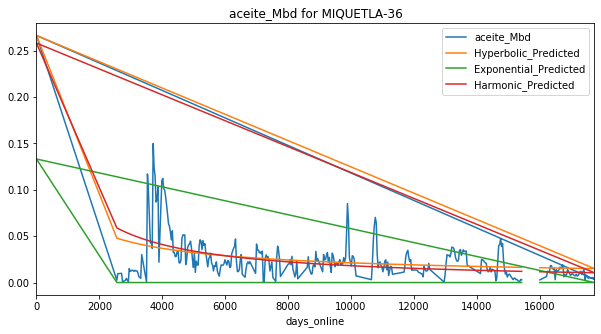

Exponential Fit Curve-fitted Variables: qi=0.1937665, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3875329999999999, b=1.4255110405730096, di=0.006335401280708821
Harmonic Fit Curve-fitted Variables: qi=0.38753299999999996, di=0.002393590525303391


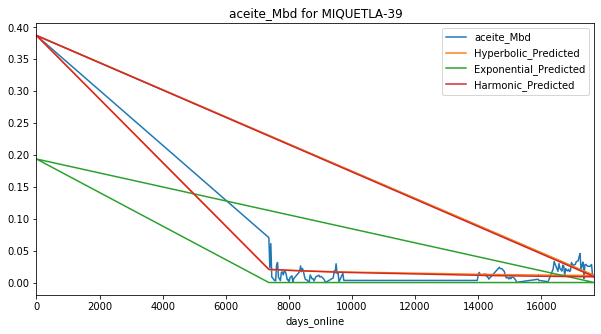

Exponential Fit Curve-fitted Variables: qi=0.129854, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.25970799999999983, b=0.4387977699354028, di=0.0008297177928301158
Harmonic Fit Curve-fitted Variables: qi=0.25970799999998384, di=0.002027134971186235


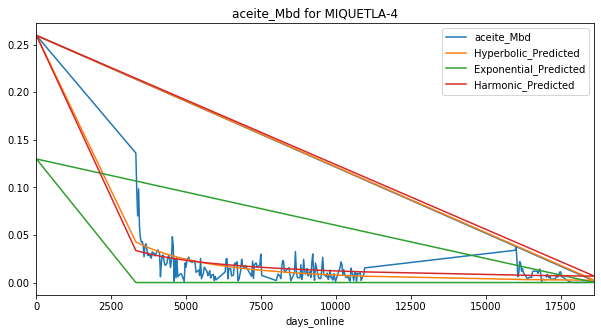

Exponential Fit Curve-fitted Variables: qi=0.09350850000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.187017, b=1.8851042266350915, di=0.00638366570813096
Harmonic Fit Curve-fitted Variables: qi=0.1870169998493598, di=0.001092409611440732


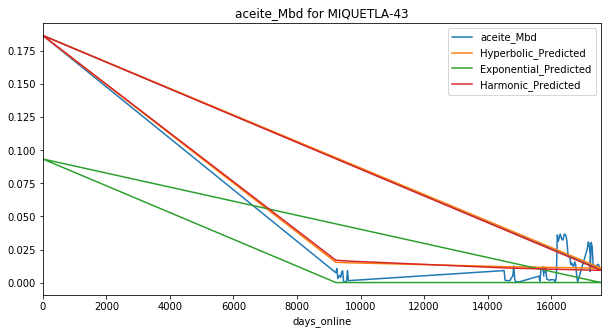

Exponential Fit Curve-fitted Variables: qi=0.09801599999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.19603199999984036, b=0.5668528362881563, di=0.0006886794711786058
Harmonic Fit Curve-fitted Variables: qi=0.19603199999999057, di=0.0011994004229758481


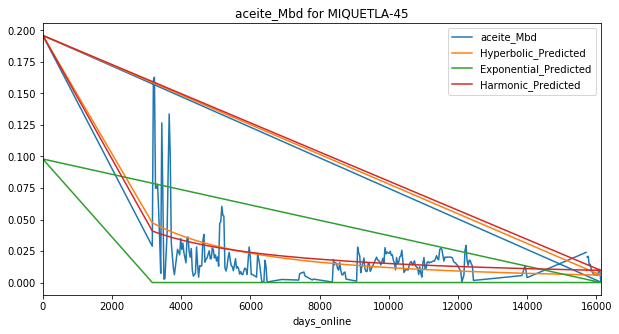

Exponential Fit Curve-fitted Variables: qi=0.086028, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1720559999924779, b=1.9999999999815334, di=0.016079734386597173
Harmonic Fit Curve-fitted Variables: qi=0.17083631731271268, di=0.0028574436440384587


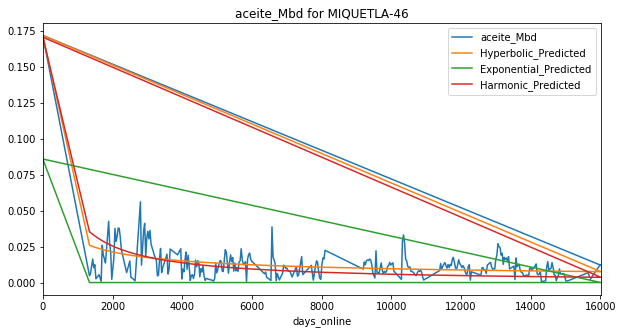

Exponential Fit Curve-fitted Variables: qi=0.169723, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2559899469414533, b=0.16196143989501252, di=0.0004837206110436295
Harmonic Fit Curve-fitted Variables: qi=0.25069415602444983, di=0.0011413152626394618


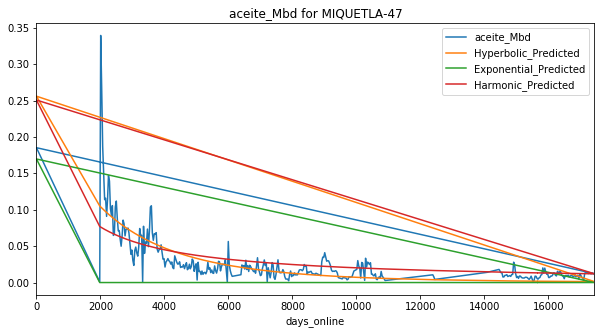

Exponential Fit Curve-fitted Variables: qi=0.088666, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1773319999999874, b=1.5285869617453052, di=0.008434578296504016
Harmonic Fit Curve-fitted Variables: qi=0.17733199999999144, di=0.003288106916549305


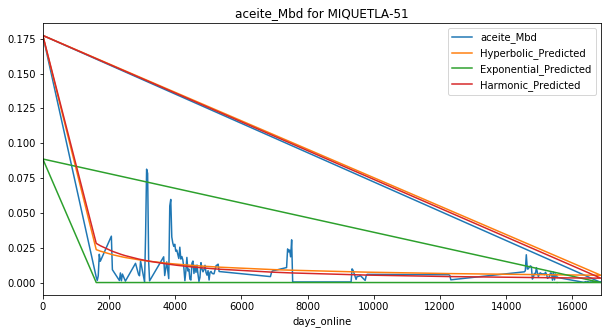

Exponential Fit Curve-fitted Variables: qi=0.076945, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.15388999999999997, b=1.9999999999999998, di=0.010557151714390737
Harmonic Fit Curve-fitted Variables: qi=0.14661685969505733, di=0.0024082581181529457


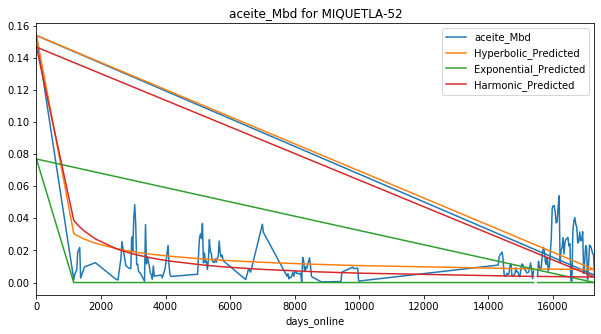

Exponential Fit Curve-fitted Variables: qi=0.037529, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.046384953243775236, b=1.1350692556158493, di=0.00015244319111524856
Harmonic Fit Curve-fitted Variables: qi=0.04582834073251894, di=0.00013912856858933854


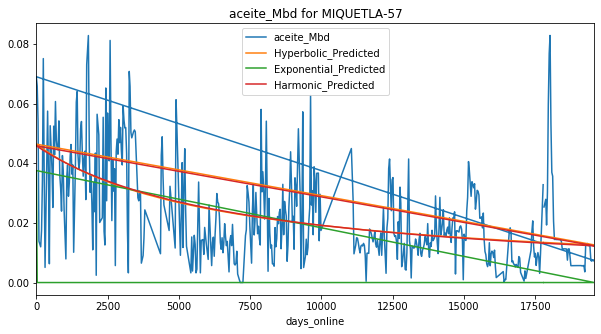

Exponential Fit Curve-fitted Variables: qi=0.117934, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.23586799999804192, b=1.5970261107851282, di=0.003916857900469027
Harmonic Fit Curve-fitted Variables: qi=0.23586799999999997, di=0.001170581246993086


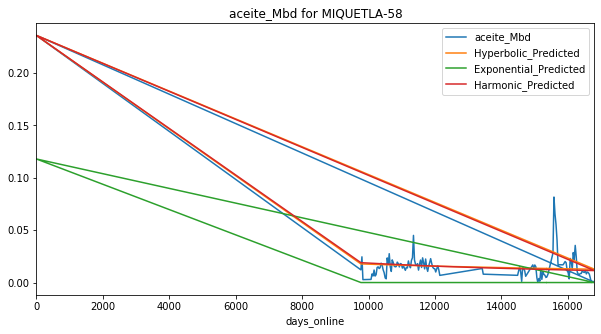

Exponential Fit Curve-fitted Variables: qi=0.060159000000000004, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12031781348323448, b=1.9999999859585964, di=0.0019192846778252517
Harmonic Fit Curve-fitted Variables: qi=0.11337601913213544, di=0.00046613635804338186


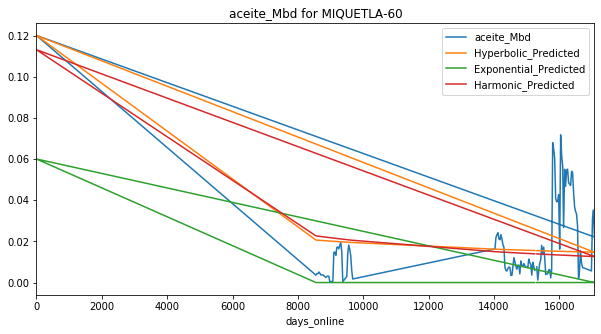

Exponential Fit Curve-fitted Variables: qi=0.057955999999999994, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11591199999999946, b=1.9999999999999865, di=0.03451055923094163
Harmonic Fit Curve-fitted Variables: qi=0.11591199999999997, di=0.023223626356093006


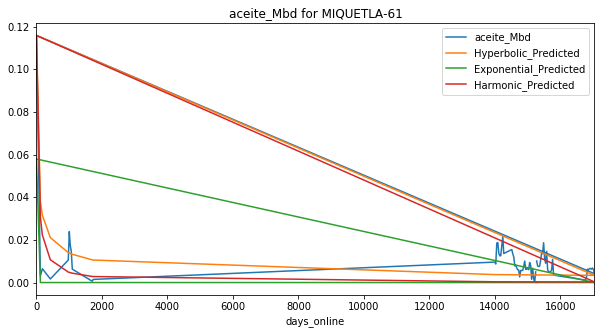

Exponential Fit Curve-fitted Variables: qi=0.069188, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13837599999999997, b=1.5728565738638198, di=0.0029981022785004127
Harmonic Fit Curve-fitted Variables: qi=0.13837589255092028, di=0.0009654893970781989


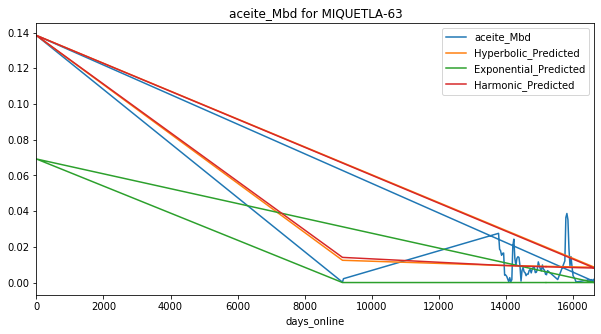

Exponential Fit Curve-fitted Variables: qi=0.051333000000000004, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.05884728464747207, b=1.9999999999999998, di=0.0014413323321687793
Harmonic Fit Curve-fitted Variables: qi=0.042431248679081095, di=0.00031171526840418956


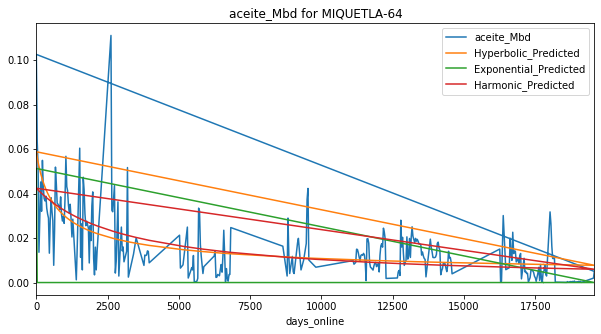

Exponential Fit Curve-fitted Variables: qi=0.040275, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08041508152904656, b=0.11940842194173666, di=0.00021820144333357055
Harmonic Fit Curve-fitted Variables: qi=0.08054999998842352, di=0.0007504525434498729


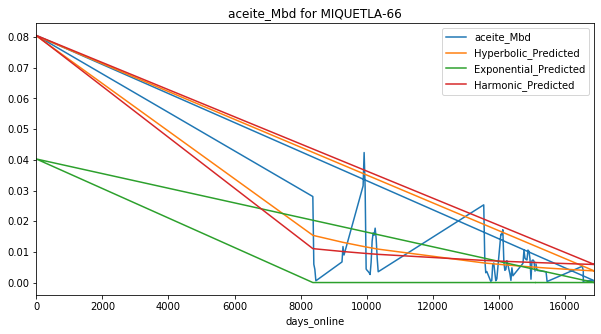

Exponential Fit Curve-fitted Variables: qi=0.033664, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04691877866139886, b=1.8462877626125218, di=0.0017603020479998704
Harmonic Fit Curve-fitted Variables: qi=0.0426436649329919, di=0.0009105264888954857


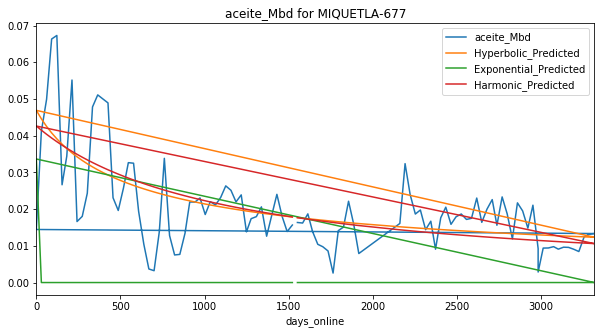

Exponential Fit Curve-fitted Variables: qi=0.051786, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1035719999999943, b=1.3662202508123276, di=0.0030983680329949295
Harmonic Fit Curve-fitted Variables: qi=0.10357199999999998, di=0.0017188192426413297


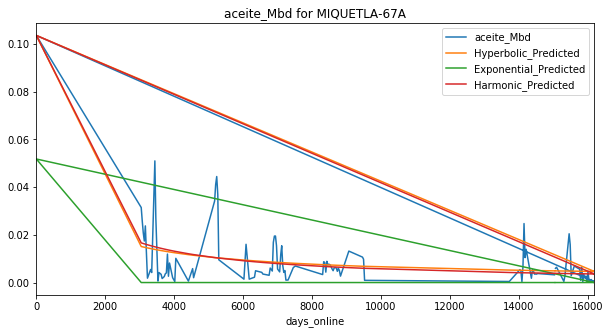

Exponential Fit Curve-fitted Variables: qi=0.090783, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.18156599999999998, b=0.6649847545590791, di=0.0007991952132392485
Harmonic Fit Curve-fitted Variables: qi=0.18156599999998976, di=0.0011523193379541395


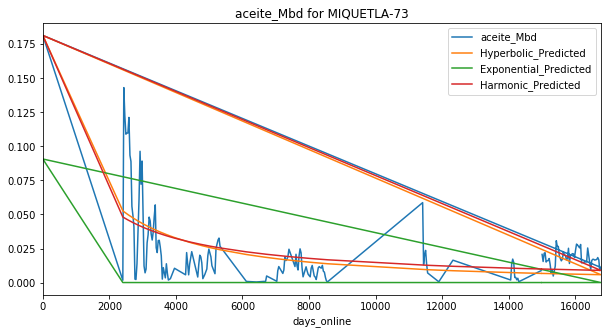

Exponential Fit Curve-fitted Variables: qi=0.011452500000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.019991056804936135, b=1.9999999999999998, di=0.006616583736720774
Harmonic Fit Curve-fitted Variables: qi=0.011382307924561557, di=0.0007748192903301626


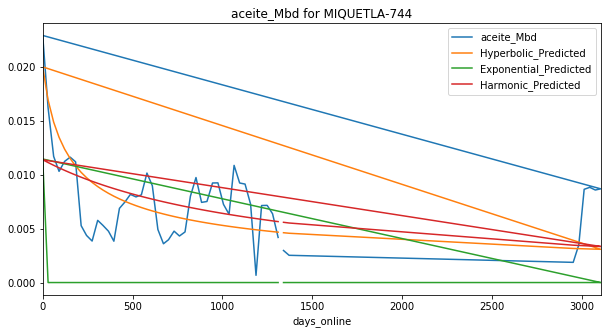

Exponential Fit Curve-fitted Variables: qi=0.077679, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1553579999999658, b=1.7180274448898034, di=0.0047071797197682725
Harmonic Fit Curve-fitted Variables: qi=0.09873294296702209, di=0.001045057655854025


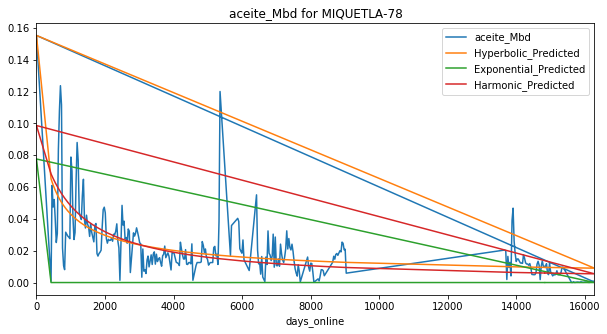

Exponential Fit Curve-fitted Variables: qi=0.08795599999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16278316077376995, b=0.6917122765709188, di=0.0010655295837638922
Harmonic Fit Curve-fitted Variables: qi=0.1669258521433178, di=0.0014937091126286698


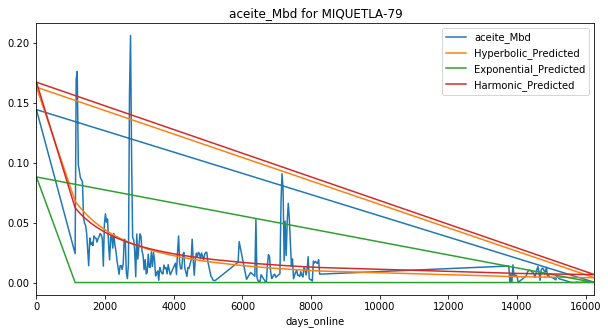

Exponential Fit Curve-fitted Variables: qi=0.1340135, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.23002898036933764, b=5.168316891712114e-08, di=0.0005967404245783607
Harmonic Fit Curve-fitted Variables: qi=0.21560296403626303, di=0.0013248973456992713


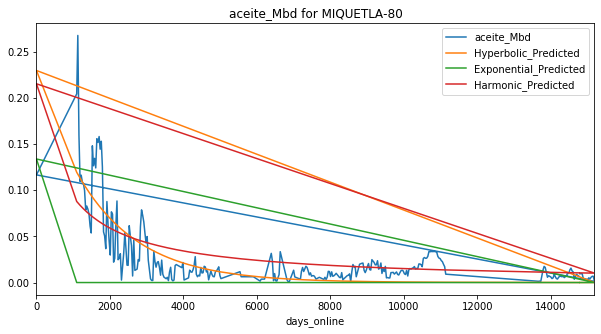

Exponential Fit Curve-fitted Variables: qi=0.05924600000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11849199999993572, b=1.3493866577418057, di=0.0015070207956969766
Harmonic Fit Curve-fitted Variables: qi=0.118492, di=0.0010083224918712725


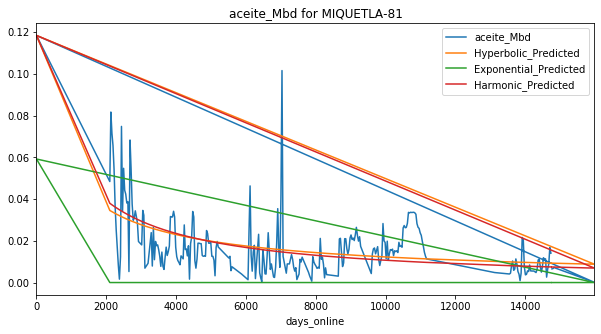

Exponential Fit Curve-fitted Variables: qi=0.05113, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.053625093600224216, b=0.827826490128366, di=0.00022111598890600908
Harmonic Fit Curve-fitted Variables: qi=0.05453979836044529, di=0.0002495115352482751


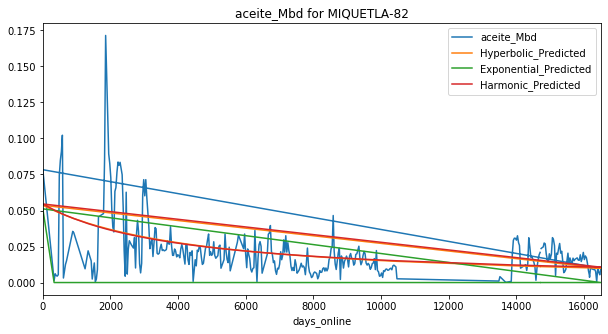

Exponential Fit Curve-fitted Variables: qi=0.1049435, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.20988699999993143, b=5.386881564066362e-12, di=0.00034533438669515266
Harmonic Fit Curve-fitted Variables: qi=0.20988699999999993, di=0.00037856289592916743


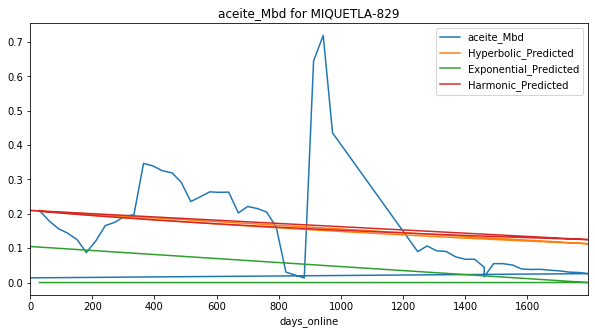

Exponential Fit Curve-fitted Variables: qi=0.0736515, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.14730299999942462, b=1.172916699878251, di=0.0011112115299055465
Harmonic Fit Curve-fitted Variables: qi=0.1473029963006771, di=0.0009180518713432701


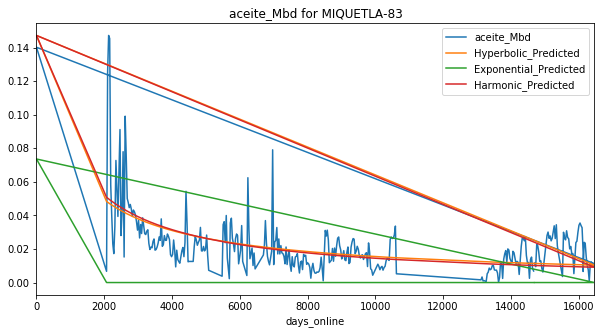

Exponential Fit Curve-fitted Variables: qi=0.1186945, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03289241508491983, b=1.9747684011610265, di=0.00013794930332550762
Harmonic Fit Curve-fitted Variables: qi=0.030865238190146565, di=8.285809465105651e-05


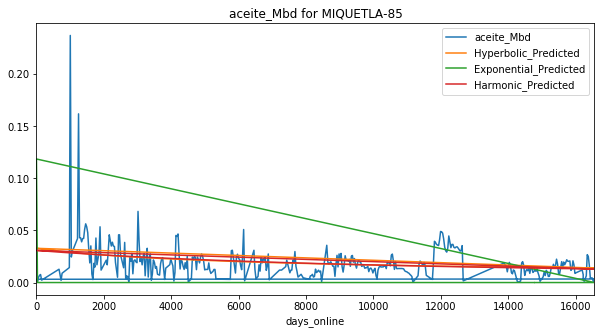

Exponential Fit Curve-fitted Variables: qi=0.0637095, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12741899999999928, b=1.9999999999999951, di=0.007943821471520935
Harmonic Fit Curve-fitted Variables: qi=0.12680659914879894, di=0.0012743660196909516


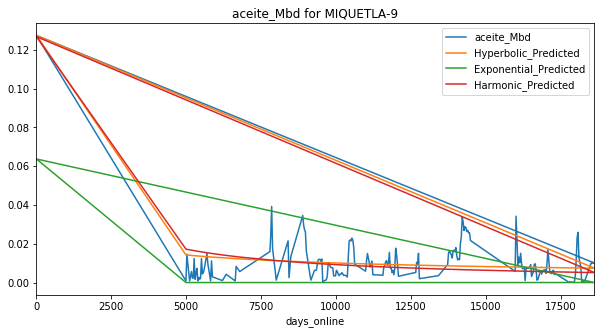

Exponential Fit Curve-fitted Variables: qi=0.02617, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.018451549545911553, b=1.9999999999999998, di=3.5581838375472923e-05
Harmonic Fit Curve-fitted Variables: qi=0.0175496687062692, di=2.219210431302684e-05


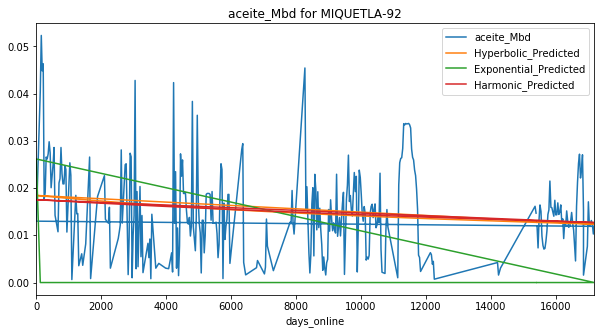

Exponential Fit Curve-fitted Variables: qi=0.0655935, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02778355090604203, b=0.9831232005892527, di=0.00012250968757287928
Harmonic Fit Curve-fitted Variables: qi=0.027816140621350884, di=0.0001236446843399694


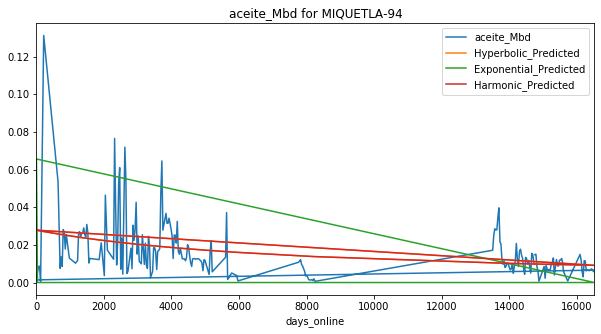

Exponential Fit Curve-fitted Variables: qi=0.028723500000000006, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.025822360774706895, b=1.716021371500047e-06, di=5.138438854378646e-05
Harmonic Fit Curve-fitted Variables: qi=0.0265903624025368, di=7.317696455666088e-05


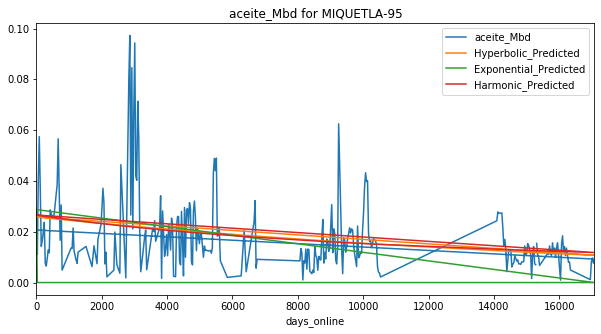

Exponential Fit Curve-fitted Variables: qi=0.0120725, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.020347793663423895, b=1.1100416792942642, di=4.277457210869248e-05
Harmonic Fit Curve-fitted Variables: qi=0.020307309967466627, di=4.1541020754157976e-05


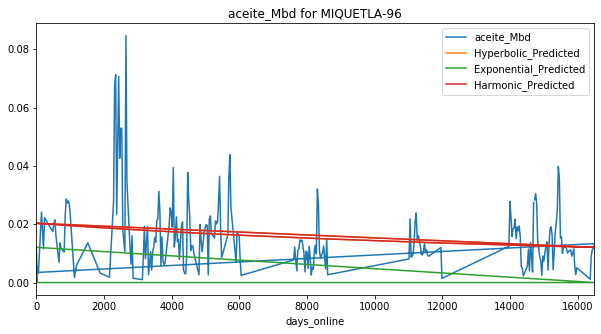

Exponential Fit Curve-fitted Variables: qi=0.042141500000000005, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02132725203246592, b=0.000928514596736596, di=1.3207284266647063e-20
Harmonic Fit Curve-fitted Variables: qi=0.021327251849086622, di=3.0754507651383526e-20


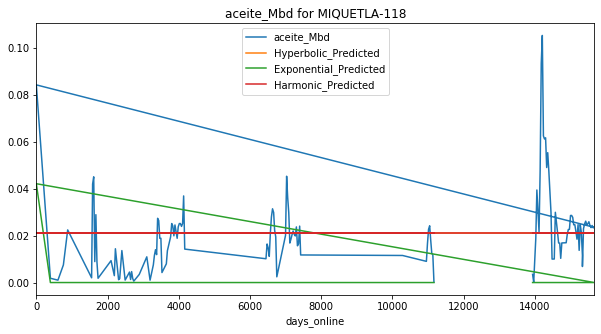

Exponential Fit Curve-fitted Variables: qi=0.0168775, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.028464982839021206, b=4.6274899806047747e-07, di=7.216802278844769e-05
Harmonic Fit Curve-fitted Variables: qi=0.0316942129020439, di=0.00013466137540275863


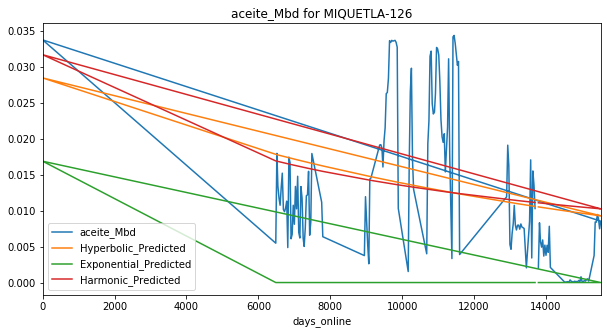

Exponential Fit Curve-fitted Variables: qi=0.08531799999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.170635997248585, b=1.999999998860278, di=0.017130430291898435
Harmonic Fit Curve-fitted Variables: qi=0.164260891979243, di=0.0053413021011417695


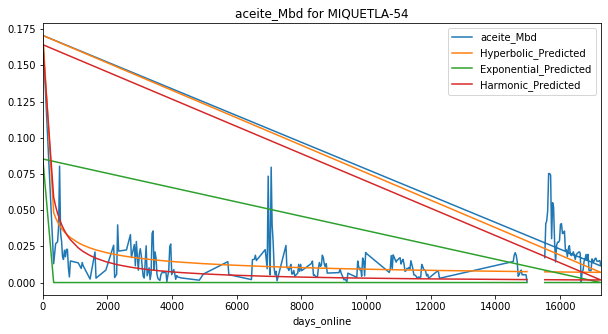

Exponential Fit Curve-fitted Variables: qi=0.0554245, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08497677213607904, b=0.8456540731771334, di=0.0018336583616012862
Harmonic Fit Curve-fitted Variables: qi=0.08598558460242799, di=0.002032159349486296


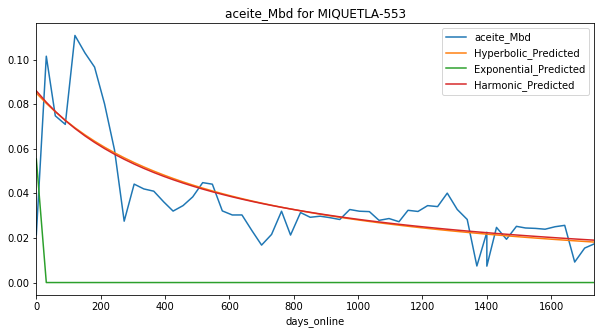

Exponential Fit Curve-fitted Variables: qi=0.040307499999999996, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04105488126683069, b=1.2236558277124003, di=0.0013639588235972954
Harmonic Fit Curve-fitted Variables: qi=0.04067806232176025, di=0.0012244484288633096


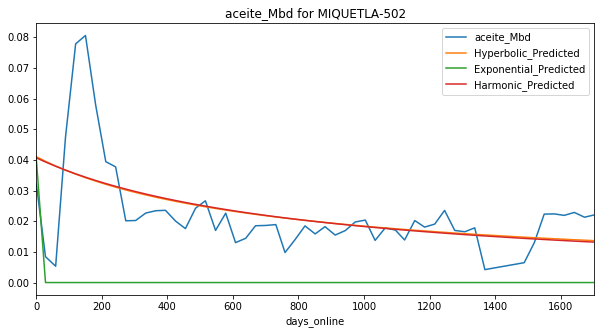

Exponential Fit Curve-fitted Variables: qi=0.02191, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.02687511582188162, b=0.5054798909776762, di=0.0013199714487972475
Harmonic Fit Curve-fitted Variables: qi=0.027749566455058616, di=0.0017763918962955371


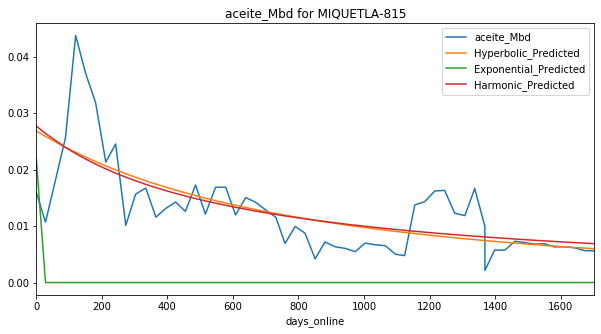

Exponential Fit Curve-fitted Variables: qi=0.059181500000000005, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.06923343010083187, b=0.24571507611154095, di=0.0027096347076882325
Harmonic Fit Curve-fitted Variables: qi=0.07140303873790381, di=0.0046915044091452515


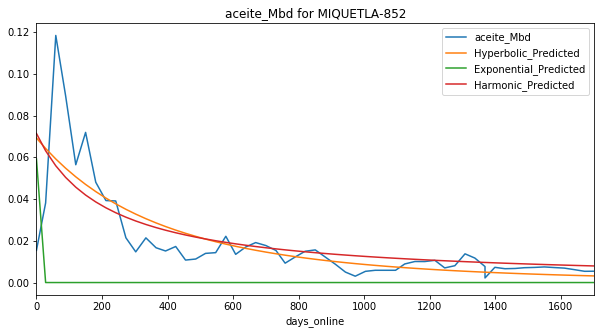

Exponential Fit Curve-fitted Variables: qi=0.055455, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.10435849584045558, b=1.9999999999999998, di=0.001074707942797913
Harmonic Fit Curve-fitted Variables: qi=0.02265708969789454, di=4.2396821927900163e-16


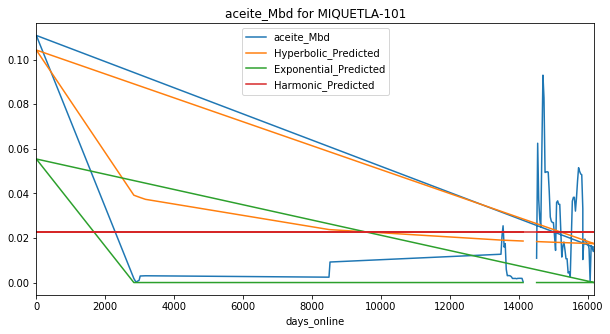

Exponential Fit Curve-fitted Variables: qi=0.038956, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07791165852387741, b=5.377718054665124e-10, di=0.00016018273982816084
Harmonic Fit Curve-fitted Variables: qi=0.07791199997729448, di=0.0006716822537539847


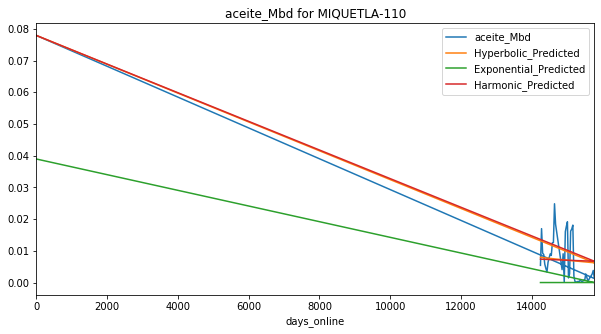

Exponential Fit Curve-fitted Variables: qi=0.056101, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11220199999999998, b=1.9999999999999998, di=0.01156465054065382
Harmonic Fit Curve-fitted Variables: qi=0.1116017353587921, di=0.0024711802342501678


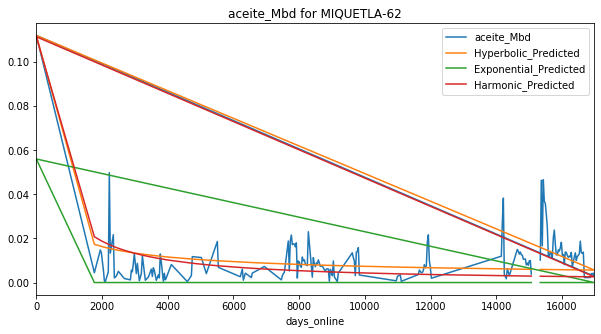

Exponential Fit Curve-fitted Variables: qi=0.0822745, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1645489999999999, b=1.8145726588769162, di=0.005931970032959879
Harmonic Fit Curve-fitted Variables: qi=0.16454892807569607, di=0.0011963380920377168


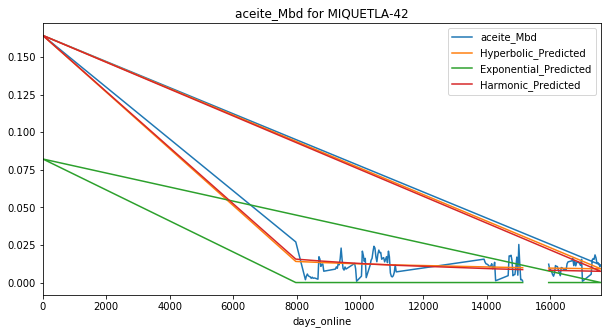

Exponential Fit Curve-fitted Variables: qi=0.019376499999999998, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.017851959180252133, b=1.9999999999999845, di=0.0002045400960089747
Harmonic Fit Curve-fitted Variables: qi=0.01545787428385024, di=9.019286972615857e-05


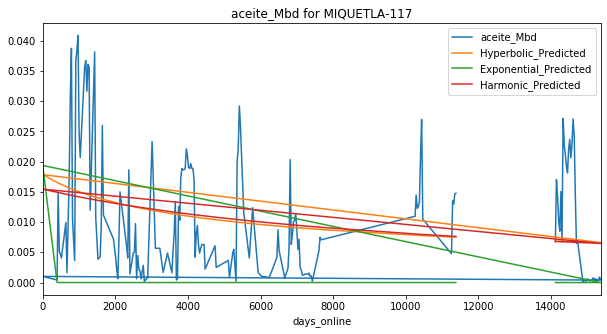

Exponential Fit Curve-fitted Variables: qi=0.058333, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07635763355218268, b=0.2132016666765466, di=0.0002964240992813833
Harmonic Fit Curve-fitted Variables: qi=0.08353627869721894, di=0.0005960758966989327


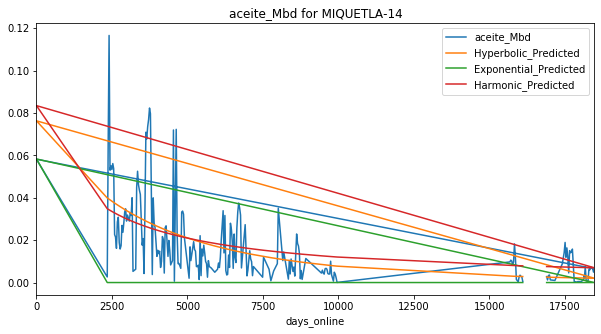

Exponential Fit Curve-fitted Variables: qi=0.12611050000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.25222099999999964, b=1.2516606312709668, di=0.004130692890766817
Harmonic Fit Curve-fitted Variables: qi=0.252221, di=0.0026899316431662893


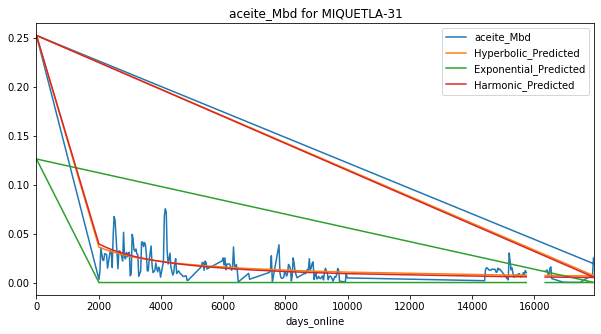

Exponential Fit Curve-fitted Variables: qi=0.0509475, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.10189499999996882, b=1.9999999999992444, di=0.020736457184544813
Harmonic Fit Curve-fitted Variables: qi=0.09963875158144882, di=0.005846942517852941


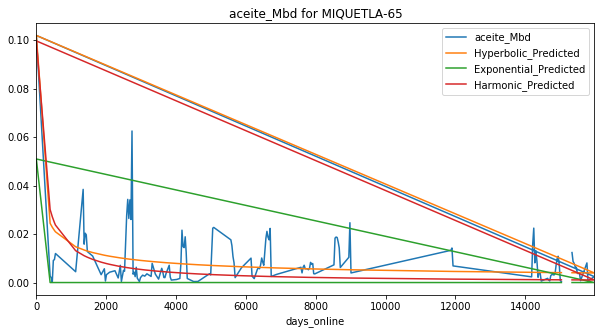

Exponential Fit Curve-fitted Variables: qi=0.08103350000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.162067, b=1.0861843042918826, di=0.0018274998356696383
Harmonic Fit Curve-fitted Variables: qi=0.16206699731703347, di=0.001527338137447412


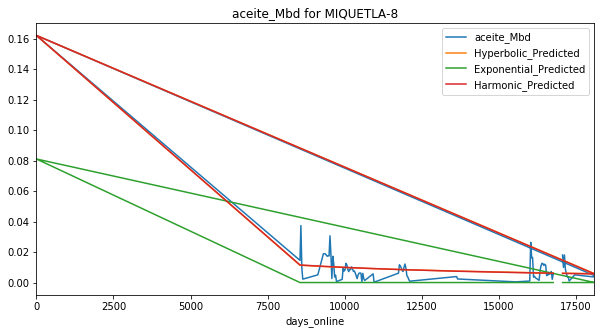

Exponential Fit Curve-fitted Variables: qi=0.070405, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.14080999999999996, b=1.9999999996608506, di=0.01933292289293027
Harmonic Fit Curve-fitted Variables: qi=0.1407989387930151, di=0.004301663122450572


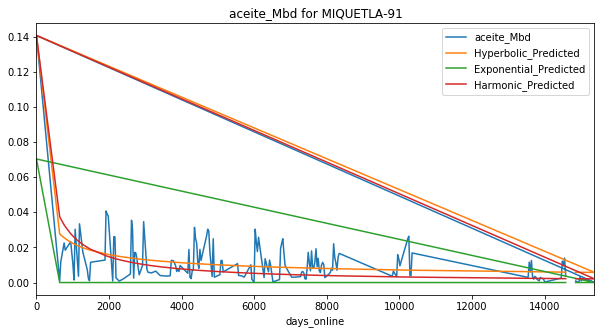

Exponential Fit Curve-fitted Variables: qi=0.119843, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2396859999999992, b=1.400262629081035, di=0.004593542179666512
Harmonic Fit Curve-fitted Variables: qi=0.23968599999999987, di=0.0023492519969750534


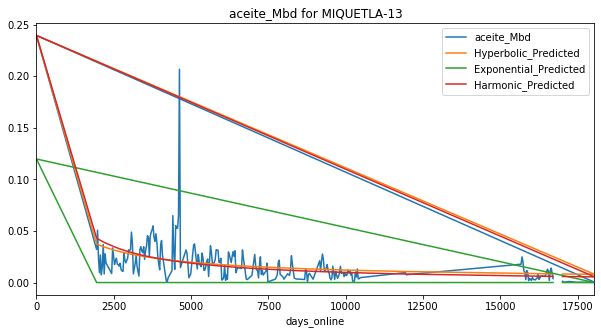

Exponential Fit Curve-fitted Variables: qi=0.07912949999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.11637171811476905, b=0.8288789046401186, di=0.0006846186107132634
Harmonic Fit Curve-fitted Variables: qi=0.12434837434463795, di=0.0008592753239420399


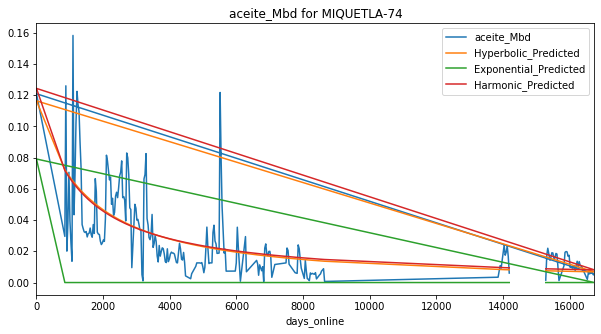

Exponential Fit Curve-fitted Variables: qi=0.060970500000000004, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12194099999954718, b=1.2244263622929064, di=0.0014065967079256124
Harmonic Fit Curve-fitted Variables: qi=0.1219409999999947, di=0.0011561557120119336


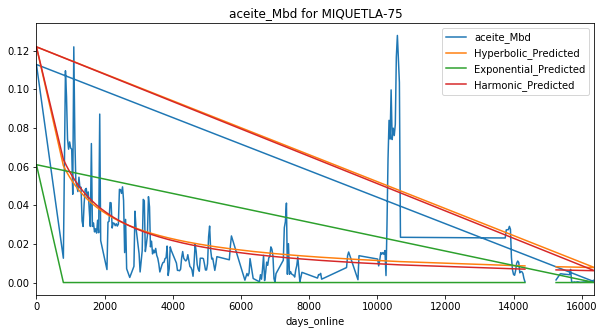

Exponential Fit Curve-fitted Variables: qi=0.084202, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.16840399999999986, b=1.1598738133134492, di=0.0014301135241638152
Harmonic Fit Curve-fitted Variables: qi=0.16840399999999997, di=0.0010964865718036134


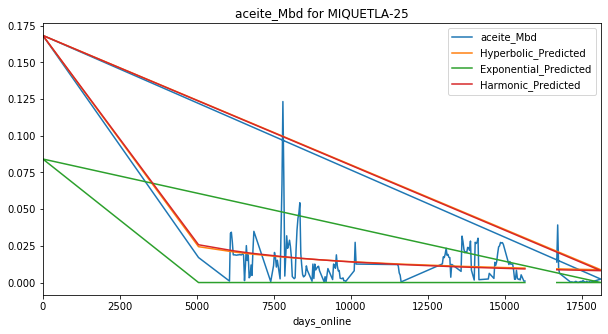

Exponential Fit Curve-fitted Variables: qi=0.0727385, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03722252659951552, b=1.9999999999999998, di=0.0002793254265539616
Harmonic Fit Curve-fitted Variables: qi=0.030625388829187222, di=0.00011017883655841176


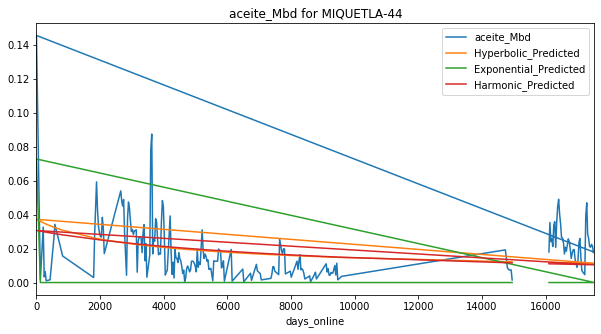

Exponential Fit Curve-fitted Variables: qi=0.062898, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1257959999999982, b=1.1630535257310406, di=0.002415252789109897
Harmonic Fit Curve-fitted Variables: qi=0.12579468123888263, di=0.001983465539660064


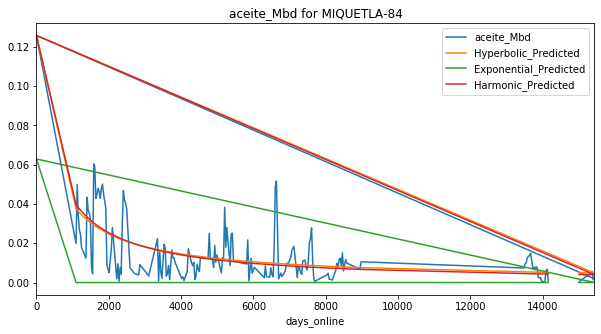

Exponential Fit Curve-fitted Variables: qi=0.119668674, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.20130629509061032, b=4.0675789889574753e-07, di=0.0005384175578367594
Harmonic Fit Curve-fitted Variables: qi=0.19607185022532117, di=0.0006155011718160567


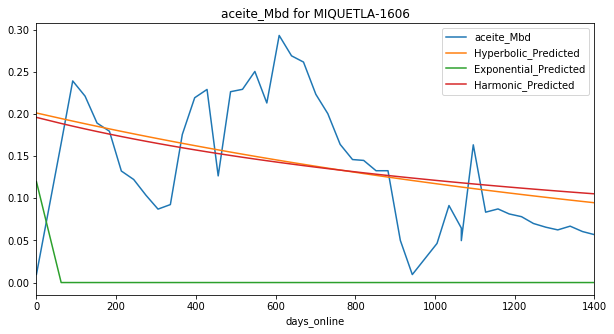

Exponential Fit Curve-fitted Variables: qi=0.1093375, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.21867499999999998, b=0.22079496116392724, di=0.00031860215115942734
Harmonic Fit Curve-fitted Variables: qi=0.2186749999999995, di=0.0016946267956946112


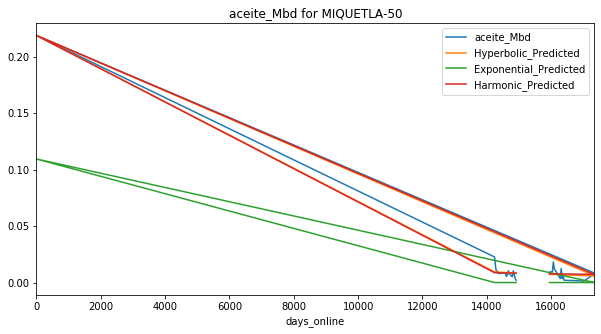

Exponential Fit Curve-fitted Variables: qi=0.091705389, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1017379452451929, b=3.421773520779446e-08, di=0.00042631269554248
Harmonic Fit Curve-fitted Variables: qi=0.09961452043129346, di=0.00046670877605613253


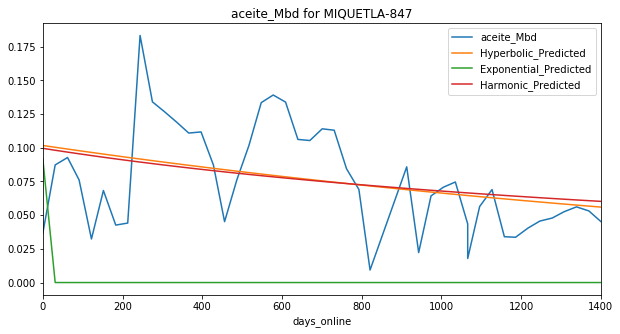

Exponential Fit Curve-fitted Variables: qi=0.0012932075, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0025864149988880794, b=1.146702644740111, di=0.026632738759060758
Harmonic Fit Curve-fitted Variables: qi=0.0025864149999937826, di=0.02322746712760111


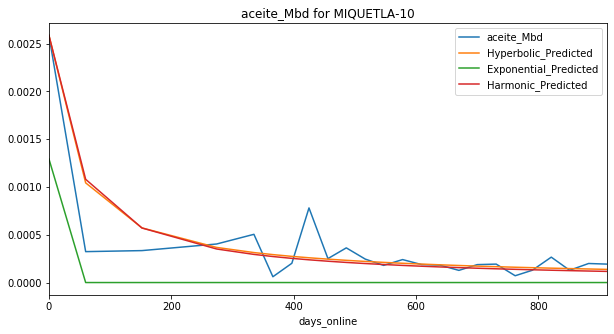

Exponential Fit Curve-fitted Variables: qi=0.023395371499999998, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.030396538645623687, b=0.503886070477346, di=0.0010582992747472481
Harmonic Fit Curve-fitted Variables: qi=0.0312463943256617, di=0.0013566321685182952


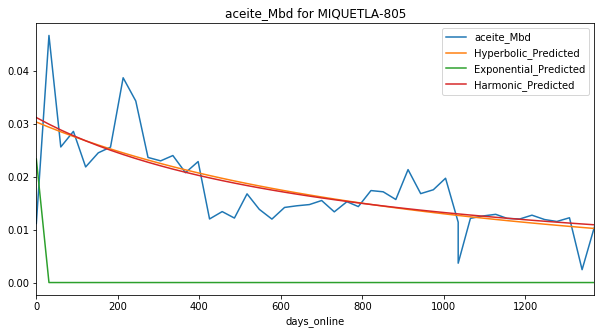

Exponential Fit Curve-fitted Variables: qi=0.052751098499999996, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09802924189426802, b=9.710061868719341e-12, di=0.00048273673366019184
Harmonic Fit Curve-fitted Variables: qi=0.0984057018590238, di=0.0005981969588310104


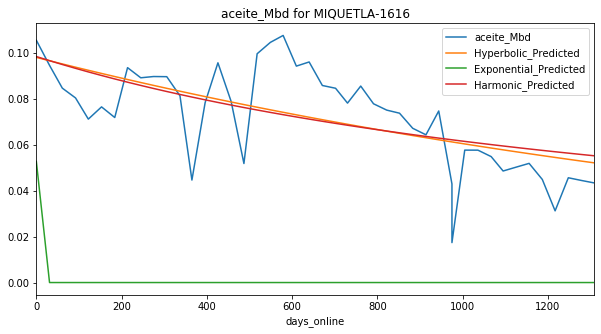

Exponential Fit Curve-fitted Variables: qi=0.057313272, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.07405443231345764, b=1.9999999999999998, di=9.464886569346612e-05
Harmonic Fit Curve-fitted Variables: qi=0.07395749298883202, di=8.889916803279596e-05


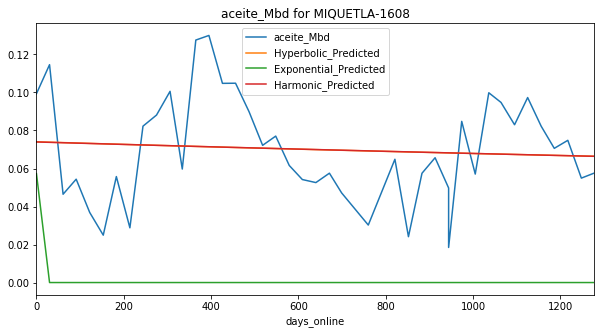

Exponential Fit Curve-fitted Variables: qi=0.015046859, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.015508337882539896, b=1.9999999999998812, di=0.00294014262346315
Harmonic Fit Curve-fitted Variables: qi=0.013798953598537746, di=0.0014032663871681454


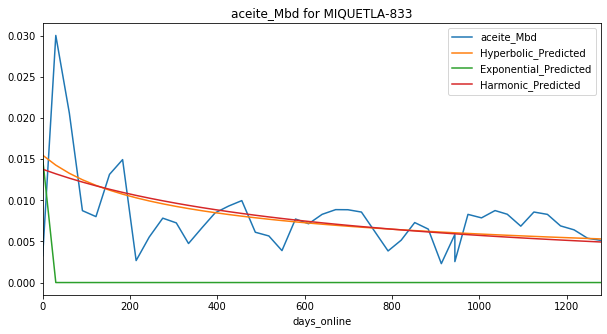

Exponential Fit Curve-fitted Variables: qi=0.013328788999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.026657564556881883, b=2.1191160037973573e-07, di=0.013932863404176045
Harmonic Fit Curve-fitted Variables: qi=0.026657577999999994, di=0.022239981187169994


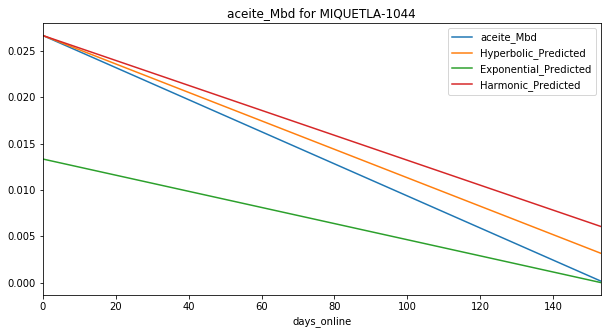

Exponential Fit Curve-fitted Variables: qi=0.0470565025, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09258596342617968, b=8.867297965434206e-11, di=0.0029701624417308994
Harmonic Fit Curve-fitted Variables: qi=0.09411300499999999, di=0.00551305352777782


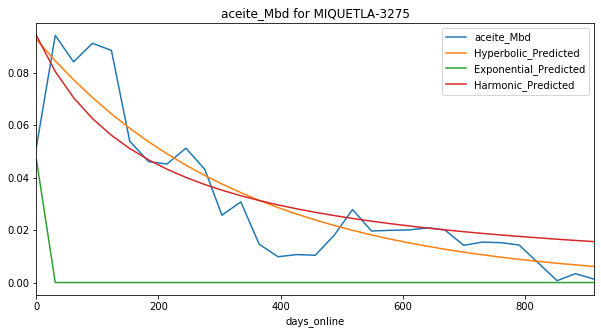

Exponential Fit Curve-fitted Variables: qi=0.0127825, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.025564999908470422, b=1.5369327926691764e-07, di=8.060305542087985e-05
Harmonic Fit Curve-fitted Variables: qi=0.025564999980093907, di=0.00015984523057259852


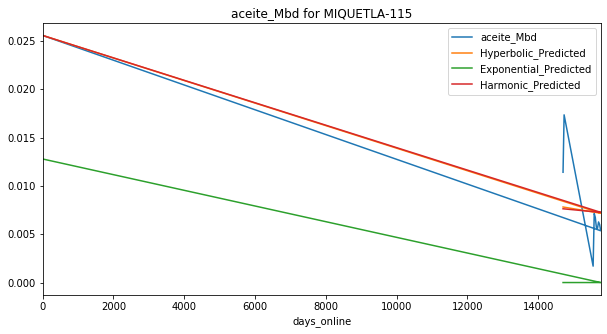

Exponential Fit Curve-fitted Variables: qi=0.01845, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.024798253416229522, b=1.9999999999999998, di=0.00010346403584580211
Harmonic Fit Curve-fitted Variables: qi=0.023309465882454368, di=6.192438828466527e-05


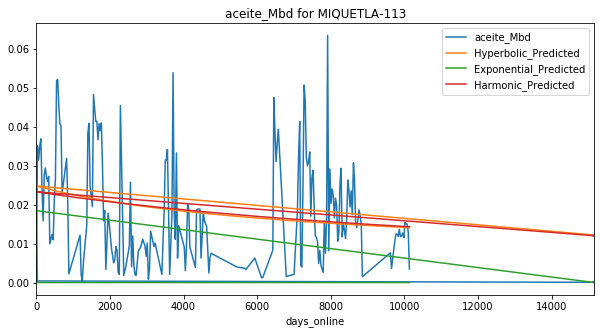

Exponential Fit Curve-fitted Variables: qi=0.09597, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.14305094131805654, b=0.7004639665130303, di=0.0008013220291520031
Harmonic Fit Curve-fitted Variables: qi=0.16993033339331418, di=0.0013207280643297299


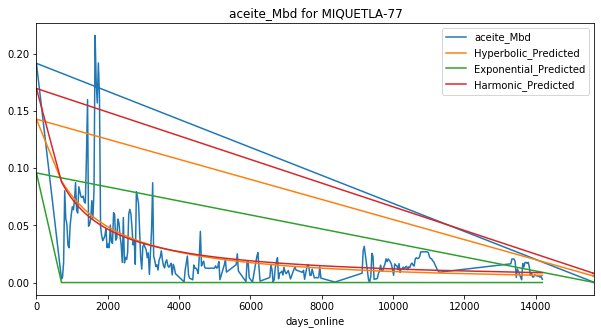

Exponential Fit Curve-fitted Variables: qi=0.134419, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.26883799999999985, b=1.1601430548809677, di=0.0020640800376787332
Harmonic Fit Curve-fitted Variables: qi=0.2688211716825399, di=0.0016537761392364412


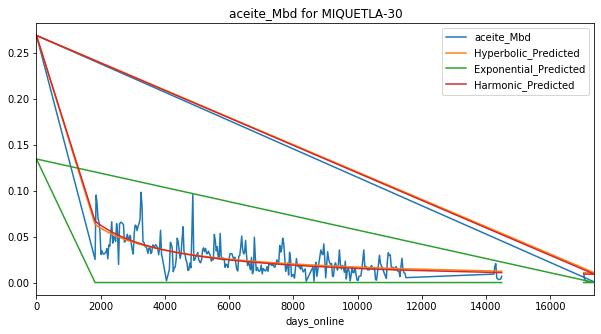

Exponential Fit Curve-fitted Variables: qi=0.18199849999999998, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.36399699999998314, b=1.0749070357198767, di=0.0036568453130882174
Harmonic Fit Curve-fitted Variables: qi=0.3639968347098305, di=0.0031722845855743876


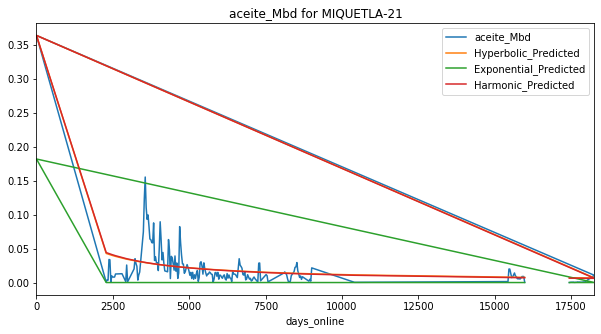

Exponential Fit Curve-fitted Variables: qi=0.070440861, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.10396688754411915, b=1.8136798980426226e-07, di=0.0015018616313234332
Harmonic Fit Curve-fitted Variables: qi=0.10579378077257488, di=0.00206796056160902


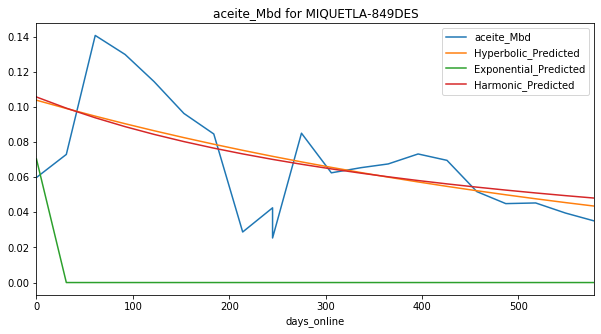

Exponential Fit Curve-fitted Variables: qi=0.11021628, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09511984351914654, b=1.9999999999217326, di=0.00013024650006219357
Harmonic Fit Curve-fitted Variables: qi=0.09504922296173438, di=0.00012446422511315107


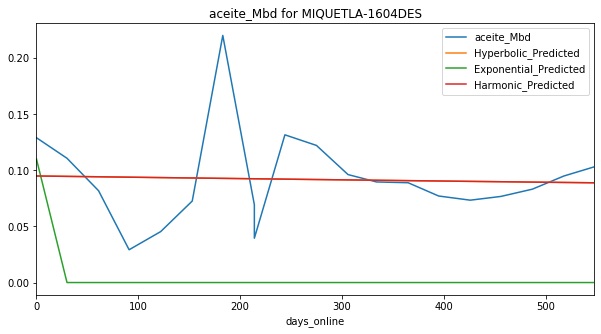

Exponential Fit Curve-fitted Variables: qi=0.046464727000000004, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0743058329791392, b=2.7116043522902377e-05, di=0.001863517710981906
Harmonic Fit Curve-fitted Variables: qi=0.07520099239664846, di=0.0025379812586159897


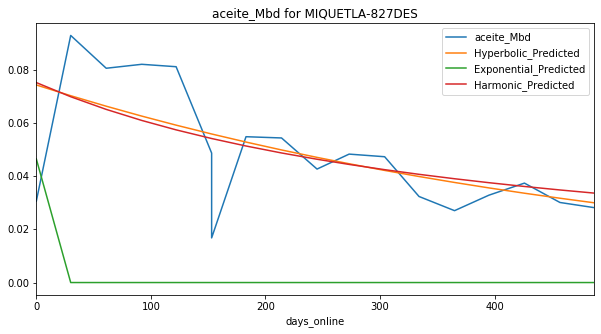

Exponential Fit Curve-fitted Variables: qi=0.049455288, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04451659100554264, b=1.1332568635954478e-06, di=8.87084508158148e-17
Harmonic Fit Curve-fitted Variables: qi=0.04451658826583623, di=1.598201282829992e-11


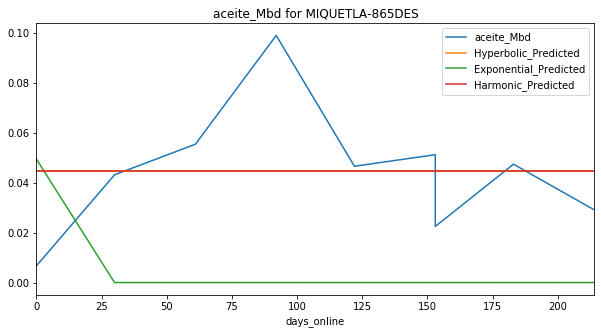

Exponential Fit Curve-fitted Variables: qi=0.0237916785, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04138549869067159, b=0.10442868481464028, di=0.002982303574789806
Harmonic Fit Curve-fitted Variables: qi=0.0437579345621394, di=0.004773375864756961


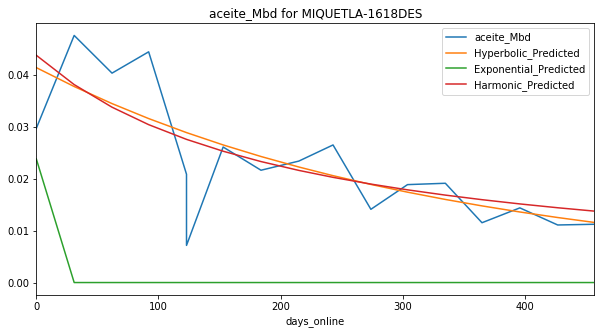

Exponential Fit Curve-fitted Variables: qi=0.025330601, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.04353967616274952, b=1.852938656499222, di=0.0031034669754997075
Harmonic Fit Curve-fitted Variables: qi=0.04222458126372714, di=0.002228312172572455


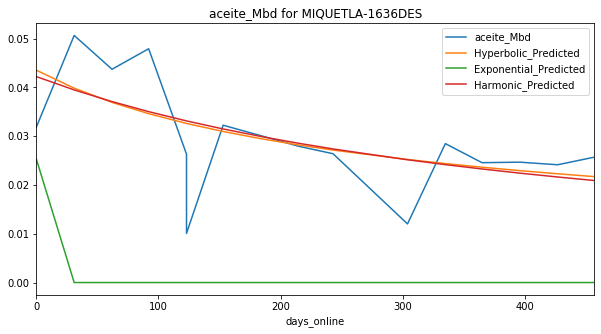

Exponential Fit Curve-fitted Variables: qi=0.0268197225, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03268291354393464, b=4.5632476521685135e-10, di=0.0025295392722545556
Harmonic Fit Curve-fitted Variables: qi=0.03206671672481007, di=0.0032415498698285207


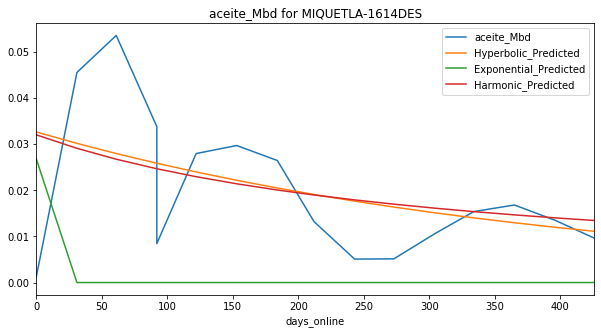

Exponential Fit Curve-fitted Variables: qi=0.11132950000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.222659, b=1.9579750809695065, di=0.012245090495101042
Harmonic Fit Curve-fitted Variables: qi=0.2226589999999554, di=0.001988870847818685


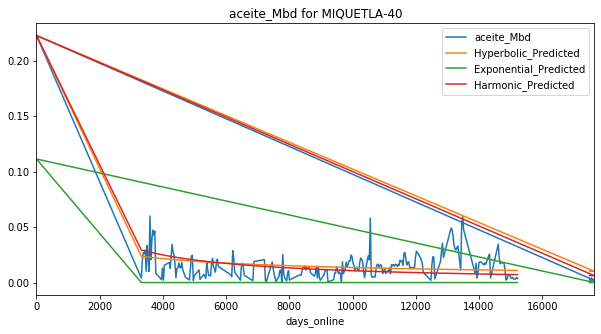

Exponential Fit Curve-fitted Variables: qi=0.0473765, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09475299999999999, b=1.0933262775712595e-07, di=0.00014366460449006082
Harmonic Fit Curve-fitted Variables: qi=0.09475299999983353, di=0.00023971126536033975


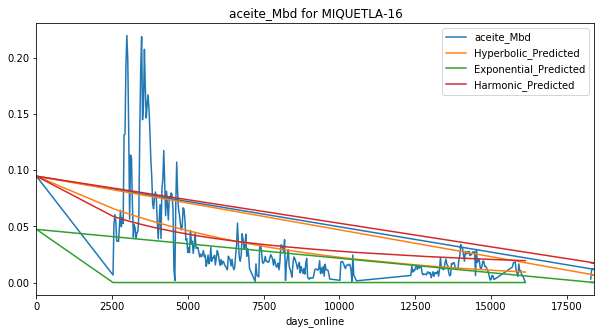

Exponential Fit Curve-fitted Variables: qi=0.0987095, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.19741899999955215, b=1.6807132093175758, di=0.0027132163883515446
Harmonic Fit Curve-fitted Variables: qi=0.16746504844442534, di=0.0009643246061253434


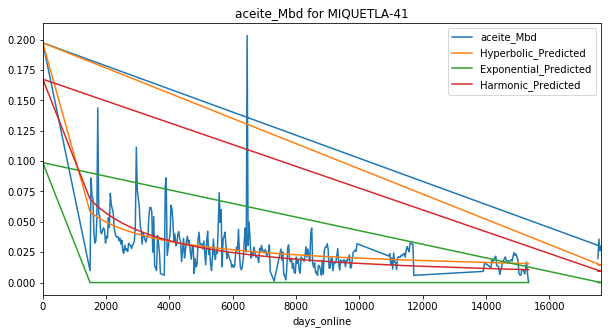

Exponential Fit Curve-fitted Variables: qi=0.10409600000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.20819199966259225, b=1.999999999999967, di=0.004723005141618219
Harmonic Fit Curve-fitted Variables: qi=0.03100597884858731, di=2.4764839217957957e-19


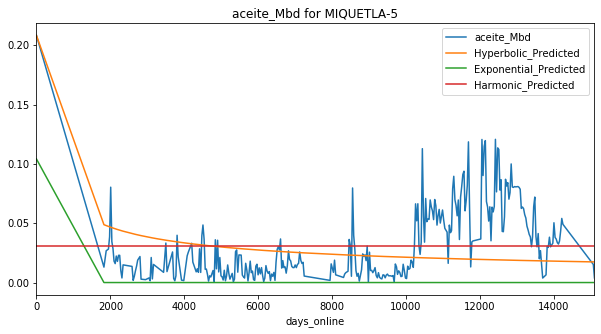

Exponential Fit Curve-fitted Variables: qi=0.1595785, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.3191569999998415, b=0.18658566825886305, di=0.0005660661778212119
Harmonic Fit Curve-fitted Variables: qi=0.31915699999998076, di=0.0017476280832207183


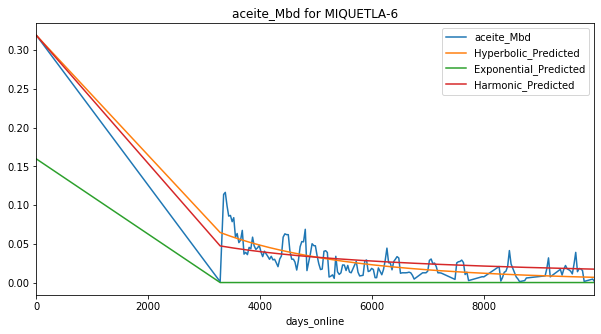

Exponential Fit Curve-fitted Variables: qi=0.098608, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.19716232964031372, b=0.8985941045341852, di=1.1886852100552106e-05
Harmonic Fit Curve-fitted Variables: qi=0.1971581883514684, di=3.044898421619794e-15


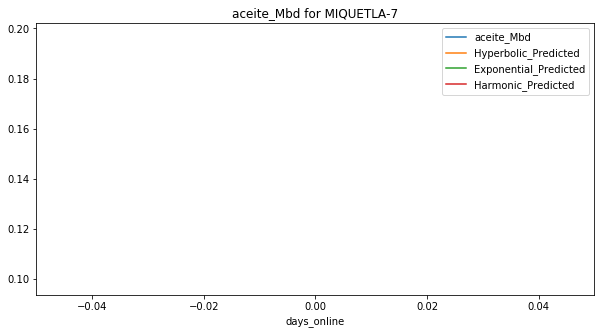

Exponential Fit Curve-fitted Variables: qi=0.06415599999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.12831199999999995, b=1.6956978915437994e-14, di=0.0002789225563013812
Harmonic Fit Curve-fitted Variables: qi=0.12831199999999787, di=0.0006229927945611759


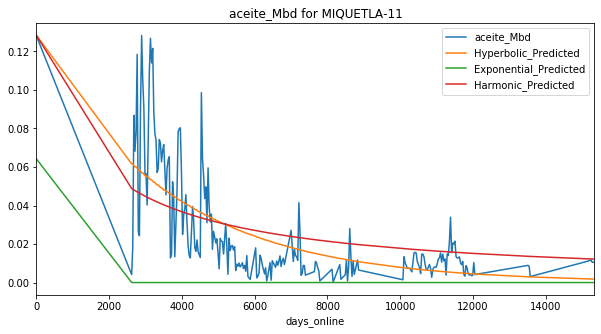

Exponential Fit Curve-fitted Variables: qi=0.07426, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13404059741707913, b=0.3738255810041174, di=0.0004319002367208937
Harmonic Fit Curve-fitted Variables: qi=0.1485199999999985, di=0.0009587276322647768


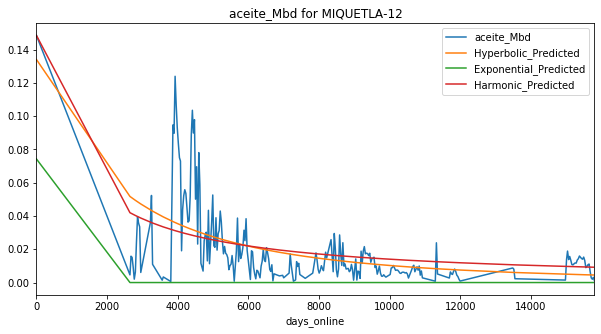

Exponential Fit Curve-fitted Variables: qi=0.1860565, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.37211299999990577, b=0.7302649930133136, di=0.0010018059518494065
Harmonic Fit Curve-fitted Variables: qi=0.37211299999998093, di=0.0015223201514060604


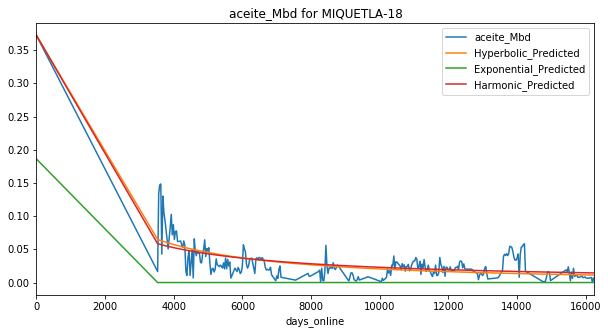

Exponential Fit Curve-fitted Variables: qi=0.25565, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.5112999999999999, b=0.1472971980564571, di=0.0003764521110161301
Harmonic Fit Curve-fitted Variables: qi=0.5112999999999999, di=0.003235878656875598


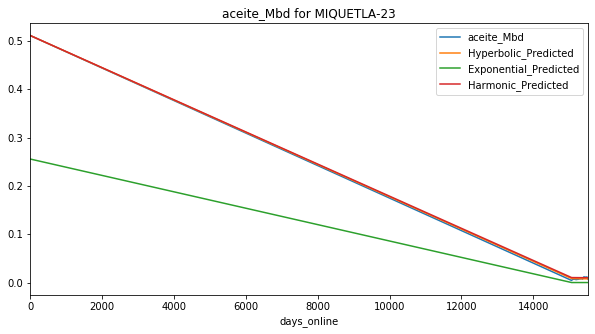

Exponential Fit Curve-fitted Variables: qi=0.13391199999999998, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2678239999999962, b=4.990868815147569e-08, di=0.0005065963624079439
Harmonic Fit Curve-fitted Variables: qi=0.2678239999999999, di=0.0032811568451799676


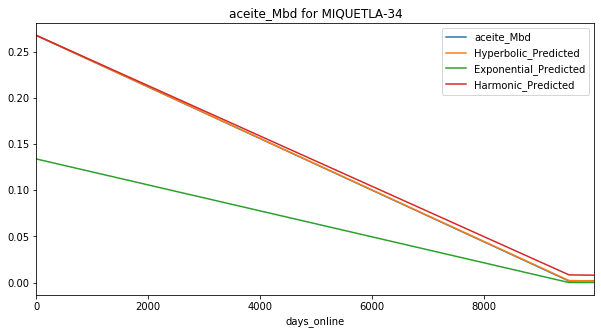

Exponential Fit Curve-fitted Variables: qi=0.1334045, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.2590436927421232, b=8.958424833348655e-08, di=0.0003913765970204515
Harmonic Fit Curve-fitted Variables: qi=0.266808999999998, di=0.000949280426312369


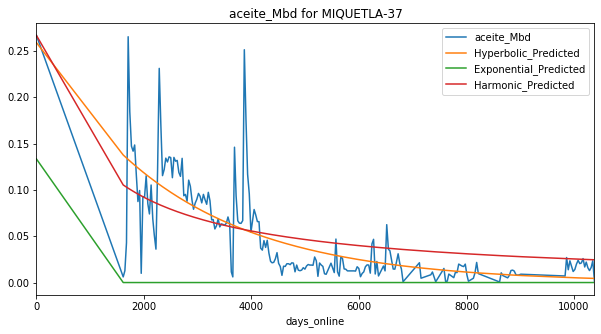

Exponential Fit Curve-fitted Variables: qi=0.1452945, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.29058899999999993, b=8.812129143412569e-15, di=0.0004496924940961566
Harmonic Fit Curve-fitted Variables: qi=0.29058899999999993, di=0.0014500354470548878


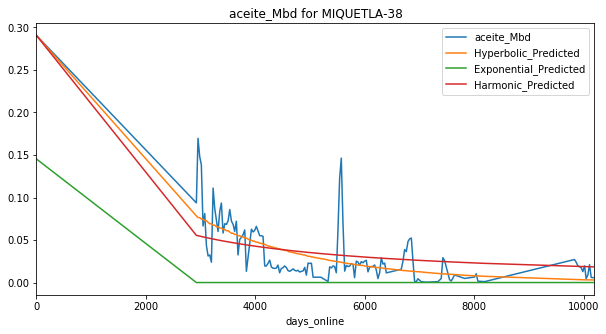

Exponential Fit Curve-fitted Variables: qi=0.1362065, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.27241298463707025, b=6.768324294729691e-07, di=0.00038821448113454665
Harmonic Fit Curve-fitted Variables: qi=0.27241299999999996, di=0.0023181857246969834


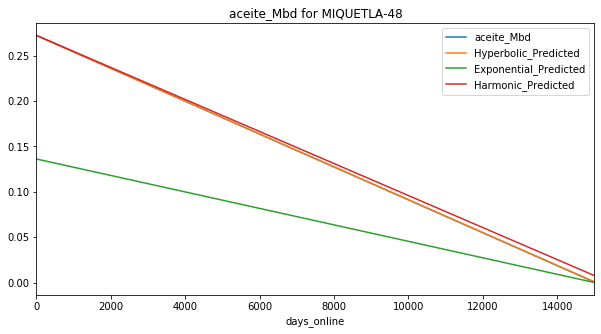

Exponential Fit Curve-fitted Variables: qi=0.11575250000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.23140694891067456, b=0.892152558201254, di=9.390600360755955e-07
Harmonic Fit Curve-fitted Variables: qi=0.23141951374471692, di=7.074373431356344e-12


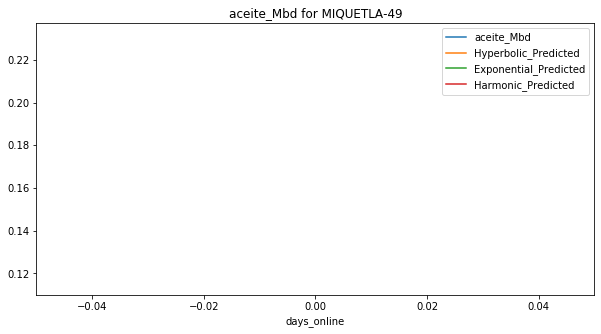

Exponential Fit Curve-fitted Variables: qi=0.07984, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.15962318256228825, b=0.9048009877483199, di=5.740108954963107e-07
Harmonic Fit Curve-fitted Variables: qi=0.1595927792648355, di=8.649258974227139e-06


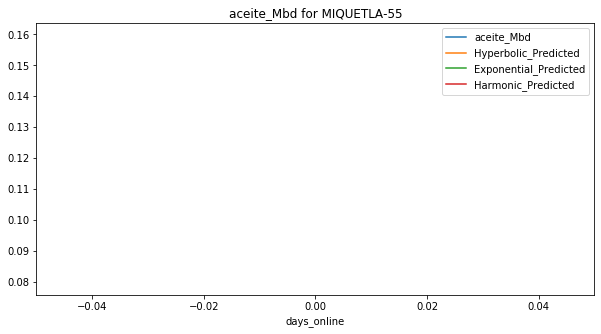

Exponential Fit Curve-fitted Variables: qi=0.06436549999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1287309990942116, b=1.1635443553381486, di=4.015374904281169e-05
Harmonic Fit Curve-fitted Variables: qi=0.12872035187955258, di=4.410980182463092e-05


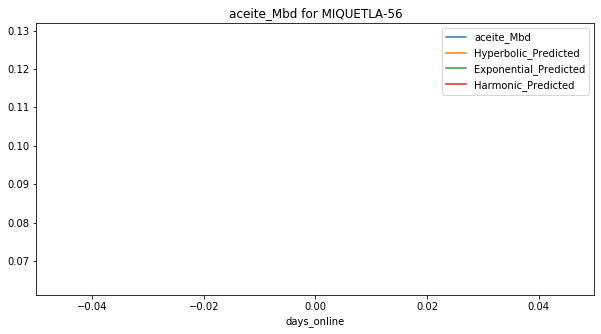

Exponential Fit Curve-fitted Variables: qi=0.12052049999999999, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.24099602994483832, b=0.8902389345911366, di=3.690490645885425e-06
Harmonic Fit Curve-fitted Variables: qi=0.24094361198847153, di=9.406065475684496e-12


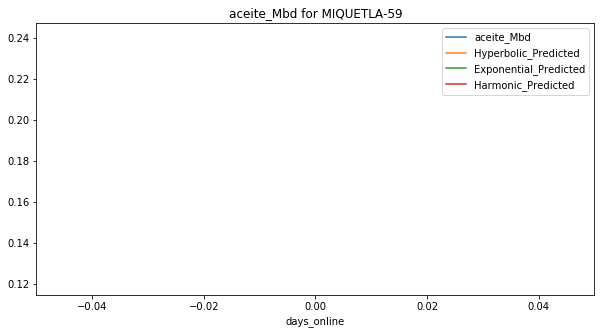

Exponential Fit Curve-fitted Variables: qi=0.048188, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.09637599945414609, b=1.0513784735381089, di=5.85883085845954e-05
Harmonic Fit Curve-fitted Variables: qi=0.09637579315866018, di=5.805111132431604e-05


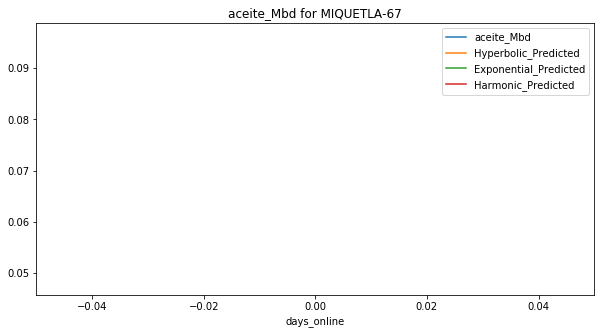

Exponential Fit Curve-fitted Variables: qi=0.065637, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.13127399697713574, b=1.097290619210569, di=5.0577000044837324e-05
Harmonic Fit Curve-fitted Variables: qi=0.13125859131375034, di=4.556493773413263e-05


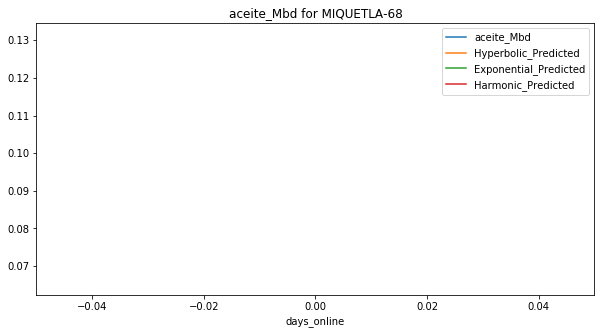

Exponential Fit Curve-fitted Variables: qi=0.0410935, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.08218699999999614, b=4.777389052884917e-09, di=0.0003459733629547176
Harmonic Fit Curve-fitted Variables: qi=0.08218699999993347, di=0.0006049419850950103


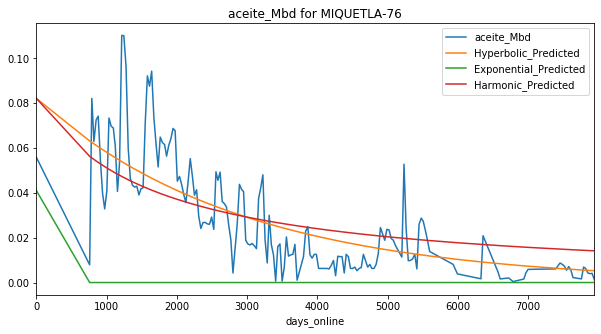

Exponential Fit Curve-fitted Variables: qi=0.056608000000000006, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.1132159990345841, b=1.1019915904670061, di=4.014496643881128e-05
Harmonic Fit Curve-fitted Variables: qi=0.11321571163330207, di=7.041137730168936e-05


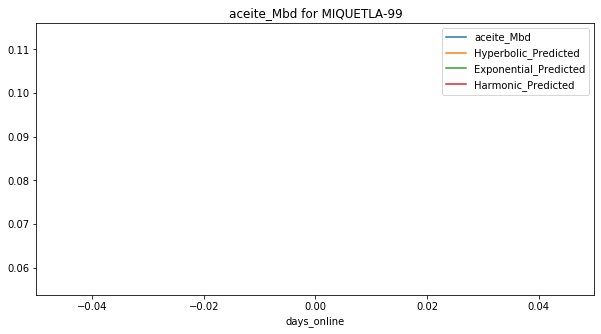

Exponential Fit Curve-fitted Variables: qi=0.0184635, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03691062121481442, b=1.9735147328309142, di=5.207624851101544e-06
Harmonic Fit Curve-fitted Variables: qi=0.036926999404310004, di=0.00016074024789839139


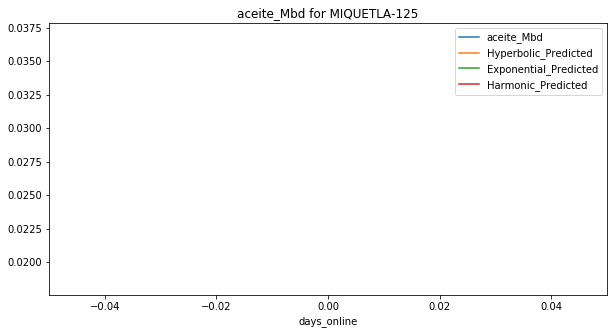

Exponential Fit Curve-fitted Variables: qi=0.017449, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.03488235247331777, b=1.9735115434088, di=4.6489709422184444e-06
Harmonic Fit Curve-fitted Variables: qi=0.03489799996825771, di=0.00016873158138647272


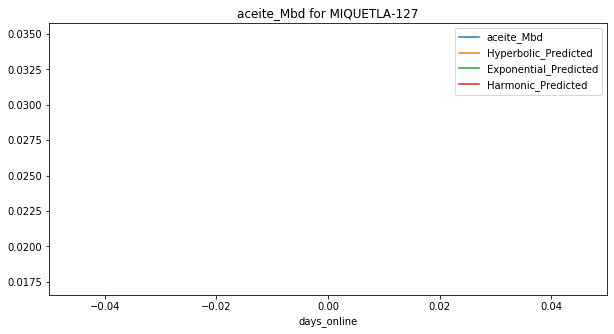

Exponential Fit Curve-fitted Variables: qi=0.006109000000000001, di=10.0
Hyperbolic Fit Curve-fitted Variables: qi=0.0053859380658779, b=7.674356824433439e-08, di=7.162507932690698e-06
Harmonic Fit Curve-fitted Variables: qi=0.005392239829613891, di=8.069335766223119e-06


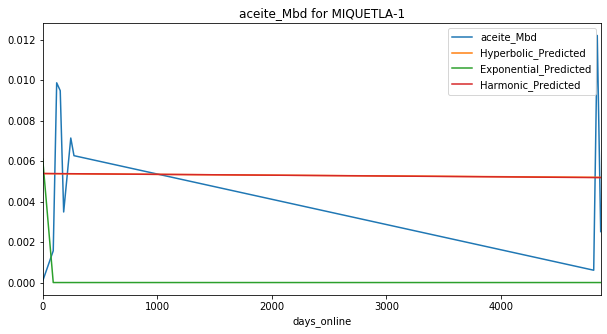

59.845511496999734

In [72]:
import timeit
tic=timeit.default_timer()

def read_in_csv(file_path):
    """
    Read in the specified csv as a pandas dataframe
    Arguments: 
        file_path: String. Path for the csv file that we want to read in
    Outputs:
        dataframe: Pandas dataframe.
    """
    well_data=pd.read_csv(file_path,parse_dates=True,index_col=0)
    return well_data

def remove_nan_and_zeroes_from_columns(df, variable):
    """
    This function cleans up a dataframe by removing rows in a specific 
    column that are null/NaN or equal to 0. This basically removes zero 
    production time periods.
    Arguments:
        df: Pandas dataframe.
        variable: String. Name of the column where we want to filter out
        NaN's or 0 values
    Output:
        filtered_df: Pandas dataframe. Dataframe with NaN's and zeroes filtered out of 
        the specified column
    """
    filtered_df = df[(df[variable].notnull()) & (df[variable]>0)]
    return filtered_df

def generate_time_delta_column(df, time_column, date_first_online_column):
    """
    Create column for the time that a well has been online at each reading, with 
    the first non-null month in the series listed as the start of production
    Arguments:
        df: Pandas dataframe
        time_column: String. Name of the column that includes the specific record date
        that the data was taken at. Column type is pandas datetime
        date_first_online_column: Name of the column that includes the date that the
        well came online. Column type is pandas datetime
    Outputs:
        Pandas series containing the difference in days between the date the well
        came online and the date that the data was recorded (cumulative days online)
    """
    df['Dias Produciendo']=(df[time_column]-df[date_first_online_column]).dt.days
    return (df[time_column]-df[date_first_online_column]).dt.days

def get_min_or_max_value_in_column_by_group(dataframe, group_by_column, calc_column, calc_type):
    global value
    """
    This function obtains the min or max value for a column, with a group by applied. For example,
    it could return the earliest (min) RecordDate for each API number in a dataframe 
    Arguments:
        dataframe: Pandas dataframe 
        group_by_column: string. Name of column that we want to apply a group by to
        calc_column: string. Name of the column that we want to get the aggregated max or min for
        calc_type: string; can be either 'min' or 'max'. Defined if we want to pull the min value 
        or the max value for the aggregated column
    Outputs:
        value: Depends on the calc_column type.
    """
    value=dataframe.groupby(group_by_column)[calc_column].transform(calc_type)
    return value

def get_max_initial_production(df, number_first_months, variable_column, date_column):
    global df_beginning_production
    """
    This function allows you to look at the first X months of production, and selects 
    the highest production month as max initial production
    Arguments:
        df: Pandas dataframe. 
        number_first_months: float. Number of months from the point the well comes online
        to compare to get the max initial production rate qi (this looks at multiple months
        in case there is a production ramp-up)
        variable_column: String. Column name for the column where we're attempting to get
        the max volume from (can be either 'Gas' or 'Oil' in this script)
        date_column: String. Column name for the date that the data was taken at 
    """
    #First, sort the data frame from earliest to most recent prod date
    df=df.sort_values(by=date_column)
    #Pull out the first x months of production, where number_first_months is x
    df_beginning_production=df.head(number_first_months)
    #Return the max value in the selected variable column from the newly created 
    #df_beginning_production df
    return df_beginning_production[variable_column].max()

def hyperbolic_equation(t, qi, b, di):
    """
    Hyperbolic decline curve equation
    Arguments:
        t: Float. Time since the well first came online, can be in various units 
        (days, months, etc) so long as they are consistent.
        qi: Float. Initial production rate when well first came online.
        b: Float. Hyperbolic decline constant
        di: Float. Nominal decline rate at time t=0
    Output: 
        Returns q, or the expected production rate at time t. Float.
    """
    return qi/((1.0+b*di*t)**(1.0/b))

def exponential_equation(t, qi, di):
    """
    Exponential decline curve equation
    Arguments:
        t: Float. Time since the well first came online, can be in various units 
        (days, months, etc) so long as they are consistent.
        qi: Float. Initial production rate when well first came online.
        di: Float. Nominal decline rate (constant)
    Output: 
        Returns q, or the expected production rate at time t. Float.
    """
    return qi*np.exp(-di*t)

def harmonic_equation (t, qi, di):
    """
    Harmonic decline curve equation
    Arguments:
        t: Float. Time since the well first came online, can be in various units 
        (days, months, etc) so long as they are consistent.
        qi: Float. Initial production rate when well first came online.
        di: Float. Nominal decline rate (constant)
    Output: 
        Returns q, or the expected production rate at time t. Float.
    """
    return qi/(1+(di*t))

def plot_actual_vs_predicted_by_equations(df, x_variable, y_variables, plot_title):
    """
    This function is used to map x- and y-variables against each other
    Arguments:
        df: Pandas dataframe.
        x_variable: String. Name of the column that we want to set as the 
        x-variable in the plot
        y_variables: string (single), or list of strings (multiple). Name(s) 
        of the column(s) that we want to set as the y-variable in the plot
    """
    #Plot results
    df.plot(x=x_variable, y=y_variables, title=plot_title,figsize=(10,5))
    plt.show()

def main(file_path):
    global well_data
    global results
    results=pd.DataFrame()
    #Read the oil and gas data
    well_data=read_in_csv(file_path)
    #Perform some data cleaning to get the columns as the right data type
    well_data['fecha']=pd.to_datetime(well_data['fecha'])
    #Declare the desired product that we want to curve fit for--it can either by 'Gas' or 'Oil'
    hydrocarbon='aceite_Mbd'
    #Remove all rows with null values in the desired time series column
    well_data=remove_nan_and_zeroes_from_columns(well_data, hydrocarbon)
    #Get a list of unique wells to loop through
    unique_well_list=pd.unique(list(well_data.pozo))
    #Get the earliest RecordDate for each Well
    well_data['first_oil']= get_min_or_max_value_in_column_by_group(well_data, group_by_column='pozo', 
                  calc_column='fecha', calc_type='min')
    #Generate column for time online delta
    well_data['days_online']=generate_time_delta_column(well_data, time_column='fecha', 
                  date_first_online_column='first_oil')
    #Pull data that came online between an specified range
    well_data_range=well_data[(well_data.fecha>='1900-01-01') & (well_data.fecha<='2019-12-01')]
    #Loop through each well, and perform calculations
    for pozo in unique_well_list:
        #Subset the dataframe by Well
        production_time_series=well_data_range[well_data_range.pozo==pozo]
        #Get the highest value of production in the first X months of production, to use as qi value
        qi=get_max_initial_production(production_time_series, 12, hydrocarbon, 'fecha')
        #Exponential curve fit the data to get best fit equation
        popt_exp, pcov_exp=curve_fit(exponential_equation, production_time_series['days_online']+12, 
                                     production_time_series[hydrocarbon],bounds=(0, [qi,20]))
        print('Exponential Fit Curve-fitted Variables: qi='+str(popt_exp[0])+', di='+str(popt_exp[1]))
        #Hyperbolic curve fit the data to get best fit equation
        popt_hyp, pcov_hyp=curve_fit(hyperbolic_equation, production_time_series['days_online']+12, 
                                     production_time_series[hydrocarbon],bounds=(0, [qi,2,20]))
        print('Hyperbolic Fit Curve-fitted Variables: qi='+str(popt_hyp[0])+', b='+str(popt_hyp[1])+', di='+str(popt_hyp[2]))
        #Harmonic curve fit the data to get best fit equation
        popt_harm, pcov_harm=curve_fit(harmonic_equation, production_time_series['days_online']+12, 
                                     production_time_series[hydrocarbon],bounds=(0, [qi,20]))
        print('Harmonic Fit Curve-fitted Variables: qi='+str(popt_harm[0])+', di='+str(popt_harm[1]))
        #Exponential fit results
        production_time_series.loc[:,'Exponential_Predicted']=exponential_equation(production_time_series['days_online'], 
                                  *popt_exp)
    
        #Hyperbolic fit results
        production_time_series.loc[:,'Hyperbolic_Predicted']=hyperbolic_equation(production_time_series['days_online'], 
                                  *popt_hyp)
        #Harmonic fit results
        production_time_series.loc[:,'Harmonic_Predicted']=harmonic_equation(production_time_series['days_online'], 
                                  *popt_harm)
        
        production_time_series.loc[:,'Qi']=popt_harm[0]
        
        #Declare the x- and y- variables that we want to plot against each other
        y_variables=[hydrocarbon,"Hyperbolic_Predicted", "Exponential_Predicted", "Harmonic_Predicted"]
        x_variable='days_online'
        #Create the plot title
        plot_title=hydrocarbon+' for '+str(pozo)
        #Plot the data to visualize the equation fit
        plot_actual_vs_predicted_by_equations(production_time_series, x_variable, y_variables, plot_title)
        
        results=results.append(production_time_series)
    
    results.to_csv(r'/Users/fffte/ainda_drive/python/csv/benchmark/'+str(input_campo)+'_dca.csv')
    
if __name__== "__main__":
    main(r'/Users/fffte/ainda_drive/python/csv/benchmark/MIQUETLA.csv')

toc=timeit.default_timer()
toc - tic #elapsed time in seconds

In [74]:
df=pd.read_csv(r'/Users/fffte/ainda_drive/python/csv/benchmark/MIQUETLA_dca.csv',
              index_col=0)

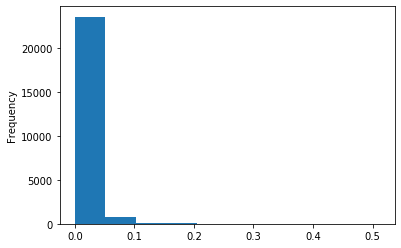

In [75]:
df.Harmonic_Predicted.plot.hist()

In [76]:
df.describe()

,aceite_Mbd,agua_Mbd,condensado_Mbd,gas_asociado_MMpcd,gas_no_asociado_MMpcd,Dias Produciendo,days_online,Exponential_Predicted,Hyperbolic_Predicted,Harmonic_Predicted,Qi
count,"24,624.00","24,624.00","24,624.00","24,624.00","24,624.00","24,624.00","24,624.00","24,624.00","24,624.00","24,624.00","24,624.00"
mean,0.02,0.00,0.00,0.04,0.00,"8,758.65","8,758.65",0.00,0.02,0.02,0.15
std,0.03,0.01,0.00,0.07,0.00,"5,167.27","5,167.27",0.01,0.02,0.02,0.11
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.01,0.00,0.00,0.01,0.00,"4,352.00","4,352.00",0.00,0.01,0.01,0.04
50%,0.01,0.00,0.00,0.02,0.00,"8,309.00","8,309.00",0.00,0.02,0.02,0.13
75%,0.03,0.00,0.00,0.05,0.00,"13,758.00","13,758.00",0.00,0.02,0.03,0.22
max,0.72,0.38,0.00,1.06,0.03,"19,631.00","19,631.00",0.26,0.51,0.51,0.51


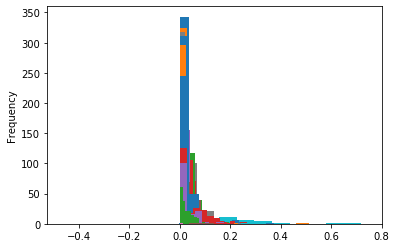

In [77]:
unique_well_list=pd.unique(list(df.pozo))

for x in unique_well_list:
        df2=df[df.pozo==x]
        display(df2.aceite_Mbd.plot.hist())

In [94]:
def productividad():
    global campo
    global unique_well_list
    global input_campo
    
    tic=timeit.default_timer()
    
    mx_stats=pd.read_csv(r'/Users/fffte/ainda_drive/python/csv/benchmark/mexico/pozos/mx_benchmark.csv',
                         index_col=0,
                         low_memory=False)
    
    display('Numero de datos en BD: '+str(len(mx_stats)))
    
    input_campo = input("Nombre de Campo: ")
    
    selected_rows=mx_stats.pozo.str.contains(str(input_campo))
    campo=mx_stats.loc[selected_rows]

    display('Numero de datos para '+str(input_campo)+': ' +str(len(campo)))
    
    unique_well_list=pd.unique(campo['pozo'])

    display('Número de pozos en ' +str(input_campo)+': '+str(len(unique_well_list)),
            unique_well_list)

    display(campo.aceite_Mbd.quantile([.1,.5,.9]),
            campo.describe())  

    dst=Distribution()
    display(dst.Fit(campo.aceite_Mbd))
    dst.Plot(campo.aceite_Mbd)
    
    campo.to_csv(r'/Users/fffte/ainda_drive/python/csv/benchmark/'+str(input_campo)+str('.csv'))
    
    toc=timeit.default_timer()
    tac= toc - tic #elapsed time in seconds
    
    return display('Tiempo de procesamiento: ' +str(tac)+' segundos')

'Numero de datos en BD: 2838332'

Nombre de Campo: KUIL


'Numero de datos para KUIL: 580'

'Número de pozos en KUIL: 13'

array(['KUIL-21', 'KUIL-1', 'KUIL-5', 'KUIL-3', 'KUIL-41', 'KUIL-20',
       'KUIL-19', 'KUIL-26', 'KUIL-11', 'KUIL-9', 'KUIL-22', 'KUIL-15',
       'KUIL-7'], dtype=object)

0.10    0.15
0.50    4.57
0.90   10.26
Name: aceite_Mbd, dtype: float64

,aceite_Mbd,agua_Mbd,condensado_Mbd,gas_asociado_MMpcd,gas_no_asociado_MMpcd
count,580.00,580.00,580.00,580.00,580.00
mean,4.71,0.61,0.00,6.95,0.00
std,3.98,0.95,0.00,5.70,0.00
min,0.01,0.00,0.00,0.00,0.00
25%,0.92,0.02,0.00,1.46,0.00
50%,4.57,0.20,0.00,6.58,0.00
75%,7.20,0.81,0.00,10.52,0.00
max,19.81,5.78,0.00,24.57,0.00


('weibull_max', 1.3144954226777125e-06)

'Tiempo de procesamiento: 22.25260234999996 segundos'

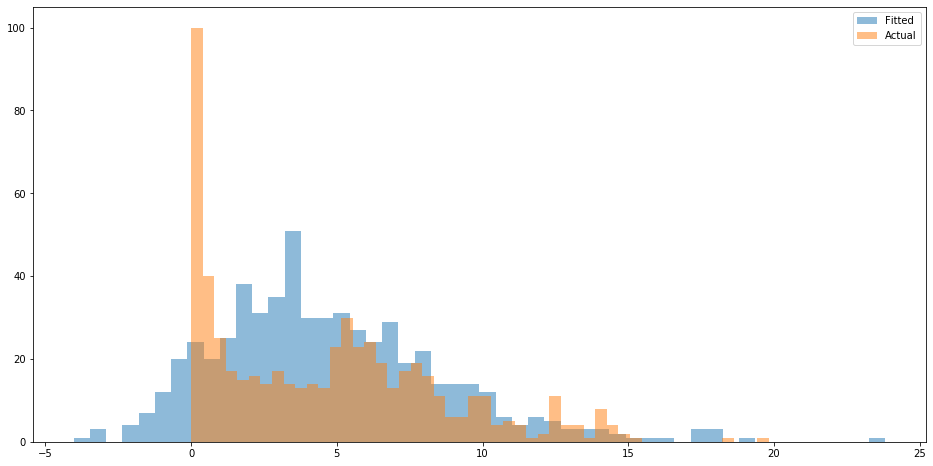

In [95]:
productividad()